# Optimization of the CRM-like Box Beam with Curved Skin

In our [last notebook](21_Optimization_of_the_CRM-like_Box_Beam_under_Distributed_Load.ipynb) we performed a structural optimization of the CRM-like box beam employing a distributed load over the length of the structure.

In this notebook we want to go a step further in complexity and perform the optimization employing a version of the CRM-like box beam that includes curved skin.

* [Definition of the CRM-like Box Beam model](#model-definition)
* [Formulation of the optimization problems](#optimization-problems)
* [Setup of the numerical model](#numerical-setup)
* [Mesh convergence study](#mesh-convergence)
* [Mesh convergence verification](#mesh-verification)
* [Comparison with the flat skin model](#comparison)
* [Linear buckling optimization](#linear)
    * [Curved skins](#linear-curved)
    * [Flat skins](#linear-flat)
* [Nonlinear structural stability optimization](#nonlinear)
    * [Curved skins](#nonlinear-curved)
    * [Flat skins](#nonlinear-flat)

In [1]:
import matplotlib.pyplot as plt  # package for making plots
import tol_colors as tc  # package for colorblind-friendly colors
import os  # package for file and directory manipulation
from matplotlib.lines import Line2D  # class defining the characters for the marker styles

# Set up matplotlib for interactive plotting and set default plot settings
%matplotlib widget
plt.rc('axes', prop_cycle=plt.cycler('color', list(tc.tol_cset('bright'))))  # set default color cycle to TOL bright
plt.rcParams["figure.dpi"] = 120  # set default dpi of figures

# Set the path to the directory containing the analysis files
ANALYSIS_DIRECTORY_PATH = os.path.join(
    os.getcwd(), "analyses", "22_Optimization_of_the_CRM-like_Box_Beam_with_Curved_Skin")

# Define constant variables related to plotting
FIRST_SUBCASE_ID = 1
SECOND_SUBCASE_ID = 2
Z_COMPONENT_INDEX = 2  # index of z-component in load and displacement array
MARKERS = list(Line2D.markers.keys())[2:]  # list of marker characters
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']  # list with default color cycle
UNSTABLE_COLOR = COLORS[1]  # color for unstable segments
GLASS_CEILING_COLOR = COLORS[2]  # green is used for glass ceiling
del COLORS[1:3]  # delete red from list of colors

# Define constant variables related to the optimization
EIGENVALUE_SCALING_FACTOR = 1e3  # scaling factor to convert eigenvalues from N/mm to N/m

# Set the environment variable for the directory containing the report files
report_directory_path = os.path.relpath(ANALYSIS_DIRECTORY_PATH, os.getcwd())
os.environ['OPENMDAO_REPORTS_DIR'] = report_directory_path

## Definition of the CRM-like Box Beam model <a name="model-definition"></a>

***

We recall the geometrical parameters that we derived in [notebook 18](18_Development_and_Nonlinear_Structural_Stability_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb).

In [2]:
import numpy as np  # import numpy library

L = 29.38e3  # [mm] box beam length
W = 3.41e3  # [mm] box beam width
H = 0.77e3  # [mm] box beam height
t0 = H/100  # [mm] initial box beam thickness
stiffeners_height = H/10  # [mm] stiffeners height
no_stiffeners = 2  # number of stiffeners
stiffeners_x_locations = np.linspace(0, W, no_stiffeners + 2)[1:-1]  # [mm] stiffeners x-coordinates
stiffeners_spacing = W/(no_stiffeners + 1)  # [mm] stiffeners spacing
ribs_spacing = stiffeners_spacing*1.4 # [mm] ribs spacing
no_ribs = round(L/ribs_spacing) + 1  # number of ribs
ribs_y_locations = np.linspace(0, L, no_ribs)  # [mm] ribs y-coordinates
print(f"""
Number of stiffeners: {no_stiffeners:d}
Number of ribs: {no_ribs:d}""")  # print number of stiffeners and ribs


Number of stiffeners: 2
Number of ribs: 19


Then we recall the material properties, taken from [Brooks et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603).

In [3]:
rho = 2780e-12  # density [tons/mm^3]
E = 73.1e3  # Young's modulus [MPa]
nu = 0.3  # Poisson's ratio
SIGMA_Y = 420.  # yield strength [MPa]

## Formulation of the optimization problems <a name="optimization-problems"></a>

***

We define the linear buckling optimization problem as follows:

$$
    \begin{aligned}
        & \text{minimize} & & m\\
        & \text{by varying} & & t_\mathrm{min} \leq \left[t_\mathrm{root}, t_\mathrm{tip}\right] \leq t_\mathrm{max}\\
        & \text{subject to :} & & g_{BLF,i}=1-BLF_i<0,\; i=1, \dots, N_{BLF}\\
        & & & g_{\sigma, j}=\sigma_k-\sigma_\mathrm{max}<0,\; j=1, \dots, N_e,
    \end{aligned}
$$

where $m$ is the structural mass, $t_\mathrm{root}$ and $t_\mathrm{tip}$ is are the wall thickness at the root and tip rib, respectively, $t_\mathrm{min}$ and $t_\mathrm{max}$ are the thickness bounds, $BLF_i$ is the $i$-th buckling load factor, $\sigma_j$ is the von Mises stress of the $j$-th element and $\sigma_\mathrm{max}$ is the yield strenght of the material.

Instead of imposing the constraints on each buckling load factor and on each element, we are going to aggregate each type of constraint using Kreisselmeier–Steinhauser (KS) functions ([Martins & Ning, 2021](https://www.cambridge.org/highereducation/books/engineering-design-optimization/B1B23D00AF79E45502C4649A0E43135B#contents)), so that we have one single value for the linear buckling constraint and one single value for the stress constraint:

$$g_{KS_{BLF}}=\max_i\left(g_{BLF,i}\right)+\frac{1}{\rho}\ln\left(\sum_{i=1}^{N_i}\exp\left(\rho\left(g_{BLF,i}-\max_i\left(g_{BLF,i}\right)\right)\right)\right),$$
$$g_{KS_\sigma}=\max_j\left(\sigma_j-\sigma_\mathrm{max}\right)+\frac{1}{\rho}\ln\left(\sum_{j=1}^{N_e}\exp\left(\rho\left(\sigma_j-\sigma_\mathrm{max}-\max_j\left(\sigma_j-\sigma_\mathrm{max}\right)\right)\right)\right).$$

We define the optimization problem with nonlinear structural stability constraints as follows:

$$
    \begin{aligned}
        & \text{minimize} & & m\\
        & \text{by varying} & & t_\mathrm{min} \leq \left[t_\mathrm{root}, t_\mathrm{tip}\right] \leq t_\mathrm{max}\\
        & \text{subject to :} & & g_{\sigma, j}=\sigma_k-\sigma_\mathrm{max}<0,\; j=1, \dots, N_e\\
        & & & g_{\lambda_{ij}}=-\lambda_{ij}<0,\; i=1, \dots, N_i,\; j=1, \dots, N_\lambda\\
        & & & g_P=0.99-\frac{P}{P_\mathrm{design}}<0
    \end{aligned}
$$

$$KS_\lambda=\max_{i,j}\left(g_{\lambda,\,ij}\right)+\frac{1}{\rho}\ln\left(\sum_{i=1}^{N_i}\sum_{j=1}^{N_\lambda}\exp\left(\rho\left(g_{\lambda,\,ij}-\max_{i,j}\left(g_{\lambda,\,ij}\right)\right)\right)\right),$$
$$KS_\sigma=\max_k\left(g_{\sigma,\,k}\right)+\frac{1}{\rho}\ln\left(\sum_{k=1}^{N_e}\exp\left(\rho\left(g_{\sigma,\,k}-\max_k\left(g_{\sigma,\,k}\right)\right)\right)\right).$$

## Setup of the numerical model <a name="numerical-setup"></a>

***

To model the skin curvature while keeping the model simple, we define the two skins to be shallow cylindrical archs between the spars.

How do we define a suitable arch radius?

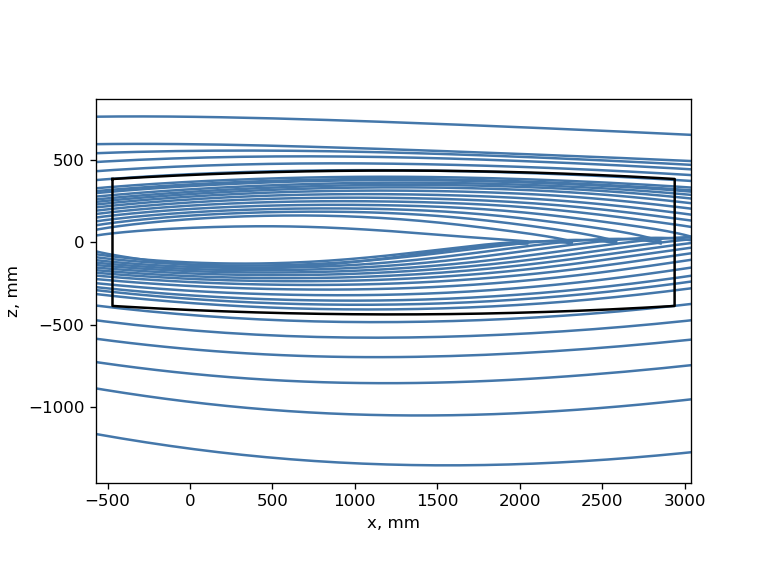

In [4]:
from resources import box_beam_utils

# Airfoil chord data taken from Taylor & Hunsaker (2021)
airfoil_chord_data = np.array([  # [xi, chord] pairs
    [0.00, 13.6161],
    [0.10, 11.8976],
    [0.15, 11.0384],
    [0.20, 10.1790],
    [0.25,  9.3197],
    [0.30,  8.4604],
    [0.35,  7.6010],
    [0.37,  7.2573],
    [0.40,  7.0416],
    [0.45,  6.6821],
    [0.50,  6.3226],
    [0.55,  5.9631],
    [0.60,  5.6035],
    [0.65,  5.2440],
    [0.70,  4.8845],
    [0.75,  4.5250],
    [0.80,  4.1654],
    [0.85,  3.8059],
    [0.90,  3.4464],
    [0.95,  3.0869],
    [1.00,  2.7274]
])


# Define a function to load the airfoil coordinates from a given file
def load_airfoil_coordinates(file_path):
    """
    Load airfoil coordinates from a given text file.

    Parameters:
    file_path (str): The path to the file containing the airfoil coordinates.

    Returns:
    numpy.ndarray: The airfoil coordinates loaded from the file.
    """
    # Check if the file exists
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"The file {file_path} does not exist.")
    
    # Load the data from the file
    data = np.loadtxt(file_path, dtype=float)
    return data


# Define a function to position the airfoils according to the chord
def position_airfoil(coordinates, chord):
    """
    Position the airfoil according to the chord.

    Parameters:
    coordinates (numpy.ndarray): The airfoil coordinates.
    chord (float): The chord length of the airfoil.

    Returns:
    numpy.ndarray: The positioned airfoil coordinates.
    """
    # Scale the coordinates based on the chord
    scaled_coords = coordinates * chord
    # Shift the airfoil so that the quarter-chord point is at x=0
    scaled_coords[:, 0] += - 0.25 * chord

    return scaled_coords


# Define a function to plot the airfoils with given airfoil data and location data
def plot_airfoils(axes):
    """
    Plot all airfoils on a single graph.

    Parameters:
    airfoil_data (list): A list of numpy arrays containing airfoil coordinates.
    airfoil_chord_data (numpy.ndarray): Array containing the chord for each airfoil position.
    """
    
    # Path to the directory containing airfoil data files
    data_directory = os.path.join(os.getcwd(), "resources", "DATA_Taylor_20201201_ALL")
    
    # Initialize an empty list to store the airfoil data
    airfoil_data = []

    # Loop through each position and load the corresponding airfoil data
    for position in airfoil_chord_data[:, 0]:
        # Construct the file name based on the given pattern
        file_name = f'uCRM-9_wr{int(position*100)}_profile.txt'
        # Construct the full file path
        file_path = os.path.join(data_directory, file_name)
        
        # Load the coordinates from the file
        try:
            airfoil_data.append(load_airfoil_coordinates(file_path))
        except Exception as e:
            print(f"An error occurred while loading data from {file_path}: {e}")
            # You might want to handle the error, skip the file, or use empty data
            # For example, here we append an empty array if the file cannot be loaded
            airfoil_data.append(np.array([]))

    for airfoil, (_, chord) in zip(airfoil_data, airfoil_chord_data):
        # Position the airfoil
        positioned_coords = position_airfoil(airfoil, chord)
        # Plot the airfoil
        axes.plot(positioned_coords[:, 0]*1e3, positioned_coords[:, 1]*1e3, color=COLORS[0])

    # Set labels and aspect ratio of the axes
    axes.set_xlabel('x, mm')
    axes.set_ylabel('z, mm')
    axes.set_aspect('equal', adjustable='box')


def plot_wingbox_section(axes, arch_height):
    # Calculate the arc's radius and center position based on beam geometry
    r = ((W / 2) ** 2 + arch_height ** 2) / (2 * arch_height)
    x_c = W / 2
    z_c_top = -r + arch_height + H / 2
    
    # Find the coordinates of the upper surface of the box beam section
    xz_coordinates_start = np.array([0, H/2])
    xz_coordinates_end = np.array([W, H/2])
    y = 0
    element_length = .01
    x_coordinates, _, _, z_coordinates_top = box_beam_utils.find_coordinates_along_arc(
                    x_c, z_c_top, r, xz_coordinates_start, xz_coordinates_end, y, y, element_length)
    z_coordinates_bottom = -z_coordinates_top
    
    # Create arrays of coordinates to describe the full box beam section
    x_coordinates_section = np.concatenate((x_coordinates, x_coordinates[::-1], x_coordinates[0:1]))
    z_coordinates_section = np.concatenate((z_coordinates_top, z_coordinates_bottom[::-1], z_coordinates_top[0:1]))

    # Plot the box beam section on the same graph as the airfoils
    x_offset = .47*1e3  # [mm] offset to match front and rear spar with upper and lower airfoil surface
    axes.plot(x_coordinates_section - x_offset, z_coordinates_section, 'k')
    
    # Set axes limit to zoom into the wingbox section
    axes.set_xlim(np.min(x_coordinates_section - x_offset) - 100, np.max(x_coordinates_section - x_offset) + 100)


# Call the function to plot the airfoils
_, ax = plt.subplots()
plot_airfoils(ax)
h_a = H/15
plot_wingbox_section(ax, h_a)
plt.show()

Similarly to our last notebook, we define the function `apply_distributed_bending_load` to apply a distributed elliptical load over the length of the CRM-like box beam. We introduce the load using non-follower forces to study only the effect of skin curvature and avoid the additional complexity of follower forces, which would generate 

In [5]:
from scipy.optimize import fsolve  # import fsolve from scipy library
from resources import pynastran_utils  # import pynastran_utils module from resources folder

FORCE_SET_ID = 11  # set id for force cards
NODE_TOLERANCE = 1e-3  # tolerance to find nodes at specific locations [mm]

def apply_distributed_bending_load(bdf, mesh):
    # Create array of nodes' coordinates and ids
    nodes_xyz_array = mesh.points
    nodes_ids = np.arange(1, len(nodes_xyz_array) + 1)
    
    # Create array with unique y-coordinates within tolerance
    y_coordinates = np.unique(nodes_xyz_array[:, 1].round(decimals=int(np.abs(np.log10(NODE_TOLERANCE)))))
    
    # Find the scaling factor that makes the total applied load equal to 1
    f = lambda x: np.sum(x * np.sqrt(1 - (y_coordinates / L)**2)) - 1  # function to be solved to find the correct scaling factor
    scaling_factor_guess = 4 / (np.pi * L)  # initial guess for the solver
    scaling_factor = fsolve(f, scaling_factor_guess)[0]  # find the root of the function to find the scaling factor
    
    # Apply distributed load over top and bottom skin
    local_forces = scaling_factor/2 * np.sqrt(1 - (y_coordinates / L)**2)  # compute local forces at each y-coordinate (scaling factor is divided by 2 because the force is applied over both top and bottom skin)
    top_skin_nodes_indices = np.flatnonzero(np.char.find(mesh.point_data['tags'], "top skin")!=-1)  # find indices of top skin nodes
    top_skin_nodes_ids = nodes_ids[top_skin_nodes_indices]  # find ids of top skin nodes
    top_skin_nodes_xyz_array = nodes_xyz_array[top_skin_nodes_indices]  # find coordinates of top skin nodes
    bottom_skin_nodes_indices = np.flatnonzero(np.char.find(mesh.point_data['tags'], "bottom skin")!=-1)  # find indices of bottom skin nodes
    bottom_skin_nodes_ids = nodes_ids[bottom_skin_nodes_indices]  # find ids of bottom skin nodes
    bottom_skin_nodes_xyz_array = nodes_xyz_array[bottom_skin_nodes_indices]  # find coordinates of bottom skin nodes
    for i, y in enumerate(y_coordinates):  # loop over unique y-coordinates
        force_magnitude = local_forces[i]  # find local force at current y-coordinate
        current_y_nodes_ids = top_skin_nodes_ids[(np.abs(top_skin_nodes_xyz_array[:, 1] - y) < NODE_TOLERANCE)]  # find id of top skin nodes at current y-coordinate
        pynastran_utils.add_uniform_force(
            bdf=bdf, nodes_ids=current_y_nodes_ids, set_id=FORCE_SET_ID, direction_vector=[0, 0, 1], force_magnitude=force_magnitude)  # distribute local force over top skin nodes at current y-coordinate
        current_y_nodes_ids = bottom_skin_nodes_ids[(np.abs(bottom_skin_nodes_xyz_array[:, 1] - y) < NODE_TOLERANCE)]  # find id of bottom skin nodes at current y-coordinate
        pynastran_utils.add_uniform_force(
            bdf=bdf, nodes_ids=current_y_nodes_ids, set_id=FORCE_SET_ID, direction_vector=[0, 0, 1], force_magnitude=force_magnitude)  # distribute local force over bottom skin nodes at current y-coordinate
    

## Mesh convergence study <a name="mesh-convergence"></a>

***

To run our mesh convergence study we define 10 different target lengths for the shell elements, ranging from half the height of the box beam to 1/8th of the height of the stiffeners. For each target length we create the mesh with the function `mesh_reinforced_box_beam_with_curved_skin` from the `box_beam_utils` module, create a `BDF` object with the function `create_base_bdf_input` from the same module, apply the load with the function `apply_distributed_bending_load` and run a linear buckling analysis with the function `run_sol_105_buckling_analysis` from the `pynastran_utils` module. We monitor the linear buckling load and the number of degrees of freedom to check the convergence of the mesh.

In [6]:
from resources import box_beam_utils, plot_utils  # import box_beam_utils module from resources folder

# Define shell elements' lengths to be used for the mesh convergence study and print them to screen
shell_element_lengths = np.geomspace(H/2, stiffeners_height/8, 10) # [m]
shell_element_lengths = [shell_element_lengths[3]]
np.set_printoptions(precision=3, suppress=True)
print("Prescribed length of shell elements for mesh convergence study [mm]:")
print(shell_element_lengths)

# Initialize arrays with number of elements, number of degrees of freedom and linear buckling loads
no_elements = np.empty(np.shape(shell_element_lengths), dtype=int)
dofs = np.empty(np.shape(shell_element_lengths), dtype=int)
linear_buckling_loads = np.empty(np.shape(shell_element_lengths))

# Define function to adjust axes ticks and labels' position
def adjust_3d_plot(axes, colorbar=None):
    axes.locator_params(axis="x", nbins=3)  # set number of ticks of x-axis
    axes.locator_params(axis="z", nbins=2)  # set number of ticks of z-axis
    axes.tick_params(axis="y", which="major", pad=20)  # adjust position of ticks' label of y-axis
    axes.tick_params(axis="z", which="major", pad=6)  # adjust position of ticks' label of z-axis
    axes.yaxis.labelpad = 80  # adjust position of y-axis's label
    axes.zaxis.labelpad = 10  # adjust position of z-axis's label
    if colorbar is not None:
        colorbar.ax.set_position(colorbar.ax.get_position().shrunk(1.0, .66))  # decrease colorbar size
        colorbar.ax.set_position(colorbar.ax.get_position().translated(-.05, .14))  # move colorbar upwards

# Iterate through the different edge lengths
for count, element_length in enumerate(shell_element_lengths):
    # Generate base bdf input
    curved_skin_mesh = box_beam_utils.mesh_reinforced_box_beam_with_curved_skins(
        width=W, height=H, arc_height=h_a, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
        stiffeners_height=stiffeners_height, element_length=element_length)
    nodes_xyz_array = curved_skin_mesh.points
    nodes_connectivity_matrix = curved_skin_mesh.faces.reshape(-1, 5)[:, 1:]
    sol_105_bdf = box_beam_utils.create_base_bdf_input(
        young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t0, nodes_xyz_array=nodes_xyz_array,
        nodes_connectivity_matrix=nodes_connectivity_matrix, parallel=True)
    
    # Apply concetrated load at the tip
    apply_distributed_bending_load(sol_105_bdf, curved_skin_mesh)
    
    # Store number of elements and number of degrees of freedom of current model
    no_elements[count] = len(sol_105_bdf.elements)
    constrained_nodes_ids = next(iter(sol_105_bdf.spcs.values()))[0].node_ids
    dofs[count] = (len(sol_105_bdf.nodes) - len(constrained_nodes_ids))*6
    
    # Run SOL 105 and return OP2 object
    input_name = f"sol_105_{no_elements[count]}_elements"
    sol_105_op2 = pynastran_utils.run_sol_105(
        bdf=sol_105_bdf, static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
        run_flag=False)
    
    # Find critical buckling load and print it
    print(f"""\n\033[1mResults of model with:
    - {element_length:.1f} mm prescribed element length
    - {no_elements[count]:d} elements
    - {dofs[count]:d} degrees of freedom\033[0m""")
    linear_buckling_loads[count] = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigr
    print(f"Buckling load: {linear_buckling_loads[count]:.0f} N")
    
    # Plot critical buckling mode
    # print("Buckling mode:")
    # _, ax, cbar = plot_utils.plot_eigenvector(
    #     op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset',
    #     length_unit='m', displacement_amplification_factor=2, unit_scale_factor=1e-3)
    # adjust_3d_plot(ax, cbar)
    # plt.show()

Prescribed length of shell elements for mesh convergence study [mm]:
[112.57468292119535]


subcase=0 already exists...skipping


Nastran job sol_105_33120_elements.bdf completed
Wall time: 15.0 s

Results of model with:
    - 112.6 mm prescribed element length
    - 33120 elements
    - 192348 degrees of freedom
Buckling load: 39823 N


Let's plot the linear buckling load as a function of the number of degrees of freedom for the different meshes. On the right axis we visualize the percentage difference with respect to the linear buckling load obtained with the finest mesh.

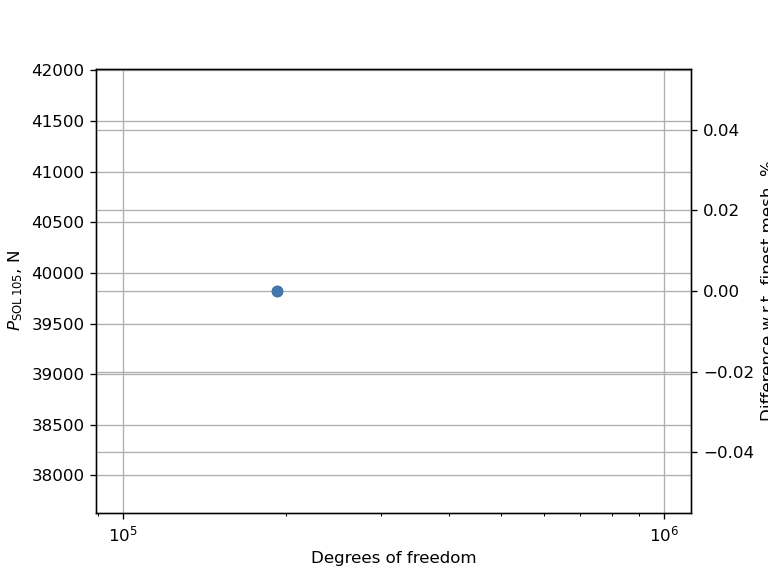

In [7]:
# Plot buckling loads vs degrees of freedom with a log scale along the x-axis
fig, ax1 = plt.subplots()  # create a figure and set of axes
buckling_load_line = ax1.semilogx(dofs, linear_buckling_loads, 'o-')

# Create a twin set of axes to plot percentage difference vs degrees of freedom
ax2 = ax1.twinx()
percentage_diff = (linear_buckling_loads/linear_buckling_loads[-1]-1)*100
percentage_diff_line = ax2.plot(dofs, percentage_diff, 'o-')

# Set plot appearance
ax1.set_xlabel("Degrees of freedom")
ax1.set_ylabel("$P_\mathrm{SOL\,105}$, N")
ax2.set_ylabel("Difference w.r.t. finest mesh, %")
ax1.grid(True)
ax2.grid(True)
plt.show()

We see that the linear buckling load converges to a value just below 40000 N. We define the mesh to be converged when the linear buckling load is within 1% of the value obtained with the finest mesh.

In [8]:
converged_mesh_index = np.where(np.abs(percentage_diff) < 1)[0][0]  # find index corresponding to first percentage difference below 1
element_length_converged_mesh = np.round(shell_element_lengths[converged_mesh_index], 1)  # store shell length of converged mesh
no_elements_converged_mesh = no_elements[converged_mesh_index]  # store number of elements of converged mesh
sol_105_buckling_load = np.round(linear_buckling_loads[converged_mesh_index])  # store buckling load of converged mesh approximating to the nearest integer
print(f"""
The mesh is converged for a target shell element length of {element_length_converged_mesh:.1f} mm,
corresponidng to {no_elements_converged_mesh} elements, {dofs[converged_mesh_index]} degrees of freedom
and to a linear buckling load of {sol_105_buckling_load:.0f} N.""")


The mesh is converged for a target shell element length of 112.6 mm,
corresponidng to 33120 elements, 192348 degrees of freedom
and to a linear buckling load of 39823 N.


### Mesh convergence verification <a name="mesh-verification"></a>

Similarly to [notebook 18](18_Development_and_Nonlinear_Buckling_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb), we want to verify the mesh convergence in the nonlinear region of the structural stability response. For this purpose, we run a nonlinear analysis using the converged mesh and another nonlinear analysis using a refined mesh obtained by halving the target element length. Ideally, the two analyses should result in approximately the same nonlinear structural stability response.

We start with the nonlinear analysis employing the converged mesh: we create the mesh and the `BDF` object, define the nonlinear analysis parameters to follow the equilibrium path with a fine resolution, apply twice the linear buckling load found in the mesh convergence study and run the nonlinear analysis calling the function `run_sol_106_with_kllrh_eigenvalues` from the `pynastran_utils` module. To assess the structural stability response we monitor the 20 smallest magnitude eigenvalues of the tangent stiffness matrix. Increase MXINC to 400 to avoid convergence issues.

In [9]:
# Create mesh with converged target element length
curved_skin_mesh = box_beam_utils.mesh_reinforced_box_beam_with_curved_skins(
        width=W, height=H, arc_height=h_a, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
        stiffeners_height=stiffeners_height, element_length=element_length_converged_mesh)

# Create BDF obejct
curved_skin_bdf = box_beam_utils.create_base_bdf_input(
        E, nu, rho, t0, curved_skin_mesh.points, curved_skin_mesh.faces.reshape(-1, 5)[:, 1:], parallel=True)

# Setup SOL 106 with arc-length method using parameters for fine resolution of equilibrium path
curved_skin_sol_106_bdf = curved_skin_bdf.__deepcopy__({})
pynastran_utils.set_up_arc_length_method(
        bdf=curved_skin_sol_106_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-6, max_bisect=20, minalr=1e-5, desiter=4, maxinc=400)

# Apply twice the linear buckling load
apply_distributed_bending_load(curved_skin_sol_106_bdf, curved_skin_mesh)  # add FORCE cards to define the elliptical load
LOAD_SET_ID = FORCE_SET_ID + 1  # id of load set
scale_factor = sol_105_buckling_load*2  # scale factor to apply to the load set
curved_skin_sol_106_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor], load_ids=[FORCE_SET_ID])  # add LOAD card
pynastran_utils.create_static_load_subcase(bdf=curved_skin_sol_106_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)  # create subcase with static load

# Run nonlinear analysis
METHOD_SET_ID = LOAD_SET_ID + 1  # id of method set used for the calculation of eigenvalues
NO_EIGENVALUES = 20  # number of eigenvalues to be calculated
UPPER_EIGENVALUE = 100.  # upper bound for eigenvalues [N/mm] - set to 10^5 N/m to avoid convergence issues of Lanczos solver
key = "original mesh"  # key to be used to store the results of the nonlinear analysis
input_name_dict = {key: f"sol_106_{no_elements_converged_mesh}_elements"}  # initialize dictionary with input names of nonlinear analyses
sol_106_op2_dict = {key: pynastran_utils.run_sol_106_with_kllrh_eigenvalues(
    bdf=curved_skin_sol_106_bdf, method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name_dict[key], upper_eig=UPPER_EIGENVALUE,
    run_flag=False)}

subcase=0 already exists...skipping


Nastran job sol_106_33120_elements.bdf completed
Wall time: 34952.0 s


Now we halve the target length of the shell elements to obtain the refined mesh and we run the same nonlinear analysis. Loosen EPSP and increase maximum number of increments to 450 for analysis with refined mesh to avoid convergence issues.

In [10]:
# Create mesh with half of the converged target element length
curved_skin_refined_mesh = box_beam_utils.mesh_reinforced_box_beam_with_curved_skins(
        width=W, height=H, arc_height=h_a, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
        stiffeners_height=stiffeners_height, element_length=element_length_converged_mesh/2)

# Create BDF object
refined_mesh_bdf = box_beam_utils.create_base_bdf_input(
        E, nu, rho, t0, curved_skin_refined_mesh.points, curved_skin_refined_mesh.faces.reshape(-1, 5)[:, 1:], parallel=True)

# Create static load subcase with twice the buckling load predicted by SOL 105
apply_distributed_bending_load(refined_mesh_bdf, curved_skin_refined_mesh)
refined_mesh_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor], load_ids=[FORCE_SET_ID])
pynastran_utils.create_static_load_subcase(
        bdf=refined_mesh_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)

# Setup SOL 106 with arc-length method using parameters for fine resolution of equilibrium path
pynastran_utils.set_up_arc_length_method(
        bdf=refined_mesh_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-5, max_bisect=20, minalr=1e-5, desiter=4, maxinc=450)

# Run analysis
no_elements_refined_mesh = len(refined_mesh_bdf.elements)
key = "refined mesh"
input_name_dict[key] = f"sol_106_{no_elements_refined_mesh}_elements"
sol_106_op2_dict[key] = pynastran_utils.run_sol_106_with_kllrh_eigenvalues(
    bdf=refined_mesh_bdf.__deepcopy__({}), method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name_dict[key], upper_eig=UPPER_EIGENVALUE, run_flag=False)

subcase=0 already exists...skipping


Nastran job sol_106_108276_elements.bdf completed
Wall time: 337142.0 s


Analogously to [notebook 18](18_Development_and_Nonlinear_Buckling_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb), we make the first comparison between the two analysis by plotting the eigenvalues of the tangent stiffness matrix against the nondimensional applied load.

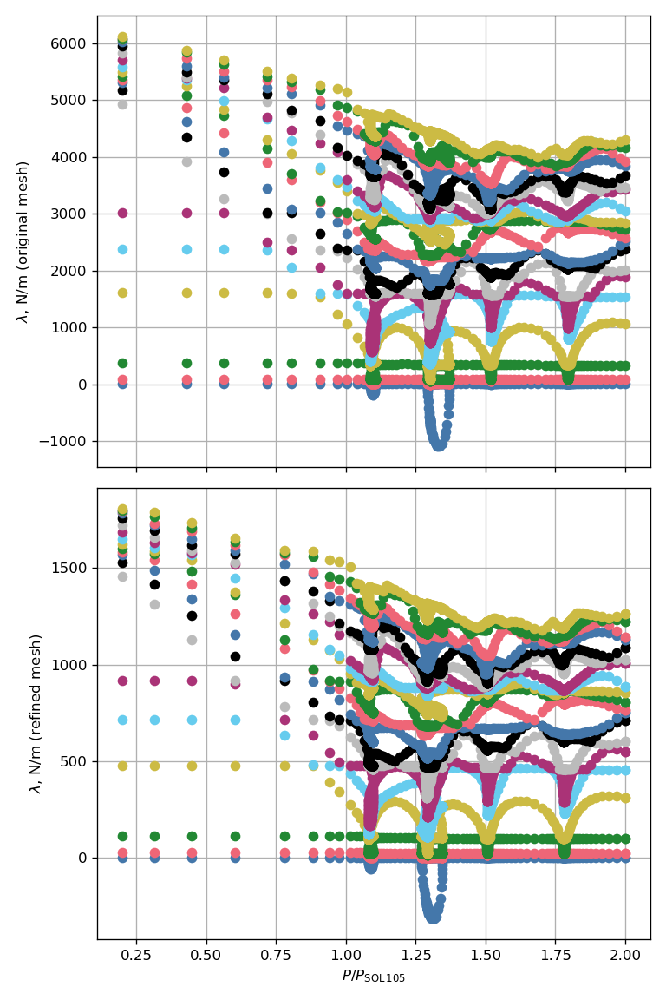

In [11]:
# Initialize dictionaries to store nondimensional applied loads and eigenvalues of tangent stiffness matrix
nondimensional_loads_dict = {}
eigenvalues_dict = {}

# Loop over the two models and read applied loads and eigenvalues
for key in sol_106_op2_dict:
    _, loads, _ = pynastran_utils.read_load_displacement_history_from_op2(op2=sol_106_op2_dict[key])  # read applied loads from OP2 object
    nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/sol_105_buckling_load  # nondimensionalize applied loads with buckling load of model with original mesh
    f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name_dict[key] + '.f06')  # path of f06 file
    eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot the eigenvalue diagram for both models
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(6.4, 4.8*2))  # create a figure with two axes
for count, key in enumerate(input_name_dict):  # iterate over the two models
    plot_utils.plot_eigenvalue_diagram(axes[count], nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)  # convert eigenvalues from N/mm to N/m
    axes[count].set_ylabel(f"$\lambda$, N/m ({key})")  # set y-axis label

# Finalize plot appearance
axes[count].set_xlabel("$P/P_\mathrm{SOL\/105}$")
plt.tight_layout()
plt.show()

Find the node associated to the tip of the box beam in both models.

In [12]:
tip_node_xyz = np.array([W/2, L, 0])  # tip node is taken at the center of the tip rib
tip_node_id_dict = {"original mesh": np.argmin(np.linalg.norm(curved_skin_mesh.points - tip_node_xyz, axis=1)) + 1,
                    "refined mesh": np.argmin(np.linalg.norm(curved_skin_refined_mesh.points - tip_node_xyz, axis=1)) + 1}

Then we find the node where the linear buckling analysis predicts the largest displacement of the critical buckling mode. For the model with the converged mesh we only need to read the op2 file of the analysis that we run during the mesh convergence study, while for the model with the refined mesh we need to run a new linear buckling analysis. In both cases, we plot the critical buckling mode highlighting the node of interest.

subcase=1 already exists...skipping


Nastran job sol_105_108276_elements.bdf completed
Wall time: 62.0 s
Critical buckling mode of original mesh


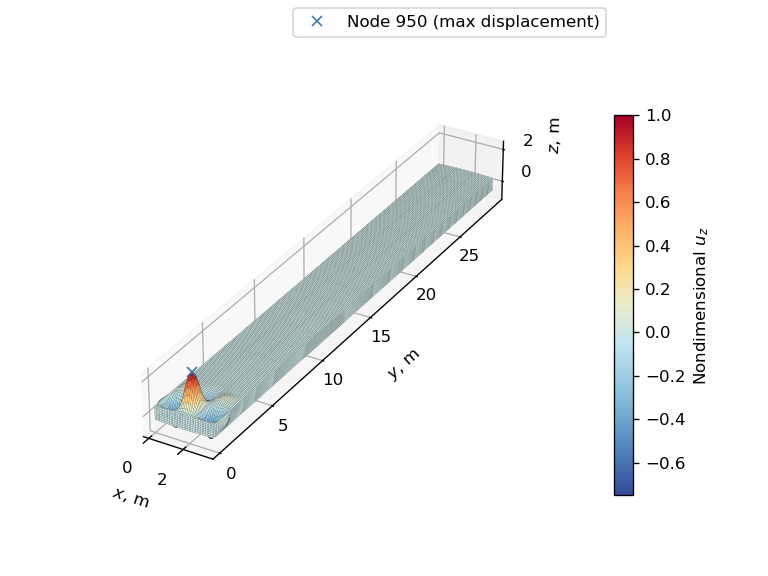

Critical buckling mode of refined mesh


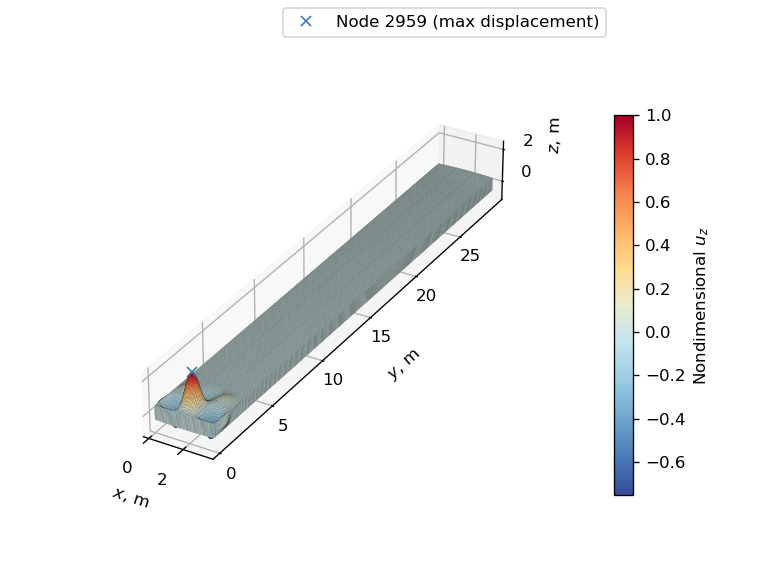

In [13]:
from pyNastran.op2.op2 import read_op2  # import function to read op2 file

# Read op2 file of SOL 105 analysis with original mesh#
key = "original mesh"
input_name = f"sol_105_{no_elements_converged_mesh}_elements"
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2_dict = {key: read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)}

# Run SOL 105 for model with refined mesh
key = "refined mesh"
input_name = f"sol_105_{no_elements_refined_mesh}_elements"
sol_105_op2_dict[key] = pynastran_utils.run_sol_105(
    bdf=refined_mesh_bdf, static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    run_flag=False)

# Loop over the two models to plot critical buckling mode and find node where maximum displacement occurs
amplification_factor = 2  # amplification factor for displacements
root_node_id_dict = {}  # initialize dictionary to store node id where max displacement occurs
for key in sol_105_op2_dict:
    
    # Plot critical buckling mode
    print(f"Critical buckling mode of {key}")
    _, ax, cbar = plot_utils.plot_eigenvector(
        op2=sol_105_op2_dict[key], subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
        displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m
    
    # Plot node where max displacement occurs and add legend
    root_node_id_dict[key] = plot_utils.plot_max_displacement_node(
        axes=ax, op2=sol_105_op2_dict[key], unit_scale_factor=1e-3, displacement_amplification_factor=amplification_factor)
    ax.legend()
    
    # Adjust plot appearance and show plot
    adjust_3d_plot(ax, cbar)
    plt.show()

Now we can read the displacement history at the two nodes for both analyses using the function `read_load_displacement_history_from_op2`.

In [14]:
# Initialize dictionary to store displacements
displacements = {}

# Read displacements of models with original and refined mesh
for key in sol_106_op2_dict:
    _, _, displacements[key] = pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2_dict[key], node_ids=[root_node_id_dict[key], tip_node_id_dict[key]])

Succesively, we nondimensionalize the local and tip displacements with the width and the length of the box beam, respectively.

In [15]:
# Initialize dictionary to store nondimensional displacements
nondimensional_displacements_dict = {}

# Iterate over the displacements of the two models and nondimensionalize with appropriate reference length
for key in displacements:
    nondimensional_displacements_dict[key] = {"root": displacements[key][root_node_id_dict[key]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
                                              "tip": displacements[key][tip_node_id_dict[key]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

Finally, we plot the 3D load-displacement diagram. We use the function `plot_3d_load_displacements_stability` from the `plot_utils` module to highlight the unstable segments of the equilibrium paths.

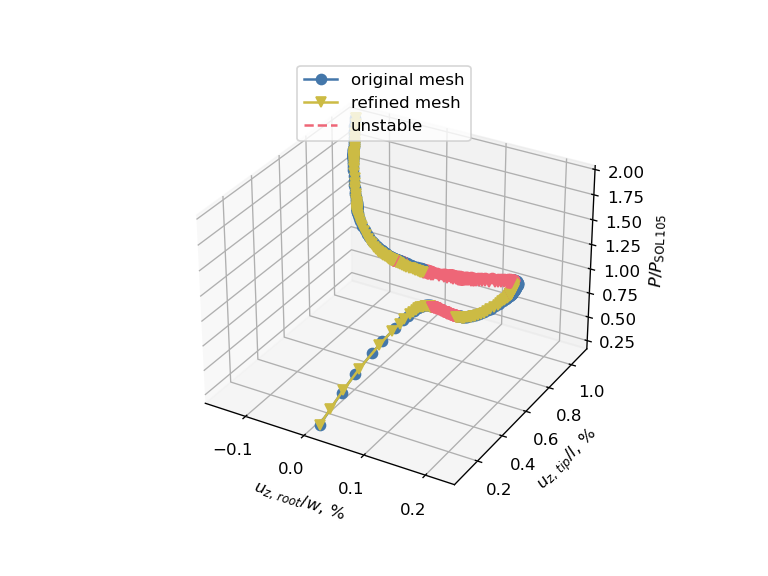

In [16]:
# Create 3D plot of equilibrium diagram
fig = plt.figure()  # create a figure
ax_3d = plt.axes(projection="3d")  # create 3D axes
stable_lines = []  # list to store proxy artists for the legend
for count, key in enumerate(nondimensional_displacements_dict):  # loop through the different meshes
    
    # Plot load-displacement curve
    plot_utils.plot_3d_load_displacements_stability(
        axes=ax_3d,
        displacements1=nondimensional_displacements_dict[key]["root"]*100,
        displacements2=nondimensional_displacements_dict[key]["tip"]*100,
        loads=nondimensional_loads_dict[key],
        eigenvalues=eigenvalues_dict[key],
        marker=MARKERS[count], color=COLORS[count])
    stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[count], color=COLORS[count], label=key))  # create proxy artist for the legend

# Add proxy artist for unstable lines and create legend
unstable_line = Line2D([0], [0], linestyle='--', color=UNSTABLE_COLOR, label="unstable")
fig.legend(handles=stable_lines + [unstable_line], loc="upper center", bbox_to_anchor=(0.5, 0.9))

# Set plot appearance
ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")
ax_3d.grid(visible=True)
plt.show()

In the attempt of gainining a clearer insight into the structural stability response found for the CRM-like box beam with curved skins, we are going to plot its structural deformation at a few points along the equilibrium path, considering only the model with the original mesh. We start by defining the function `plot_load_displacement_comparison` to plot the applied load against the local displacement for both meshes. This time we use the function `plot_2d_load_displacements_stability` from the `plot_utils` module to plot the applied load against the local displacement and highlight the unstable segments.

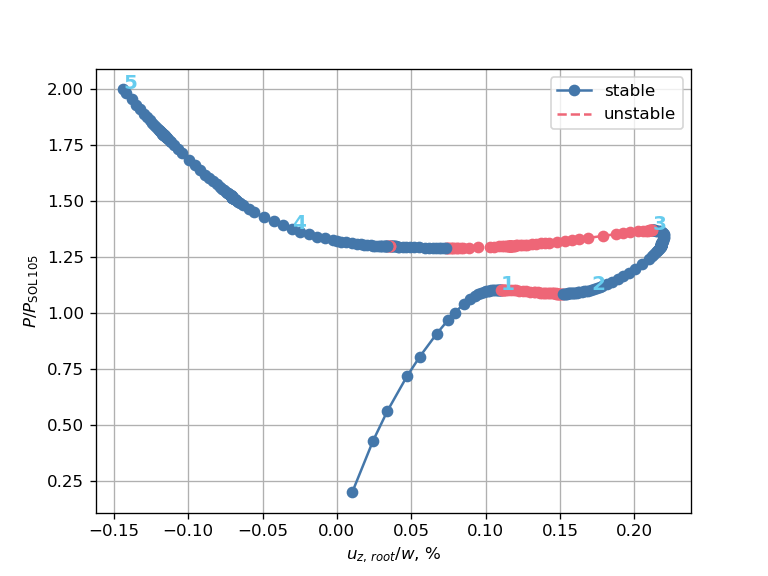

Deformation of point 1:


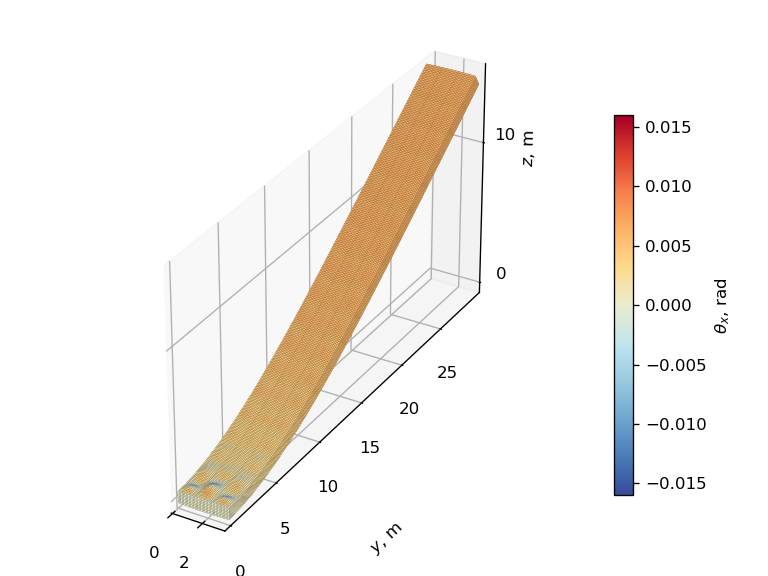

Deformation of point 2:


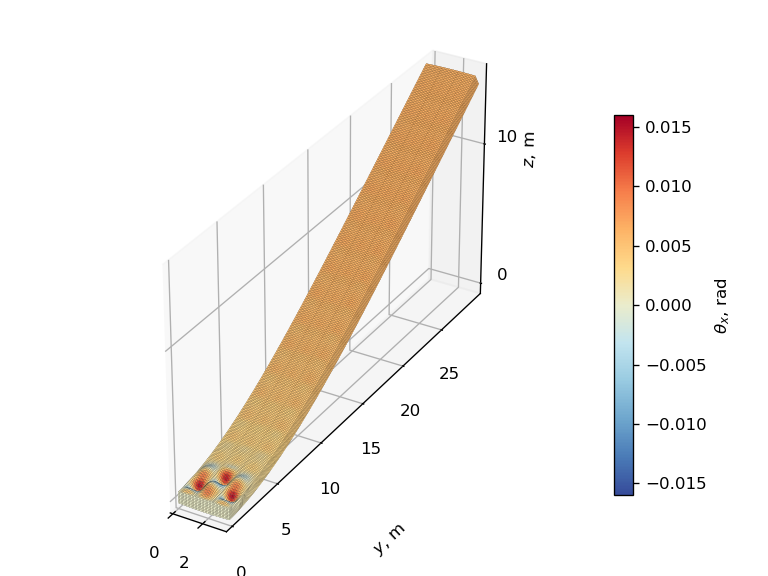

Deformation of point 3:


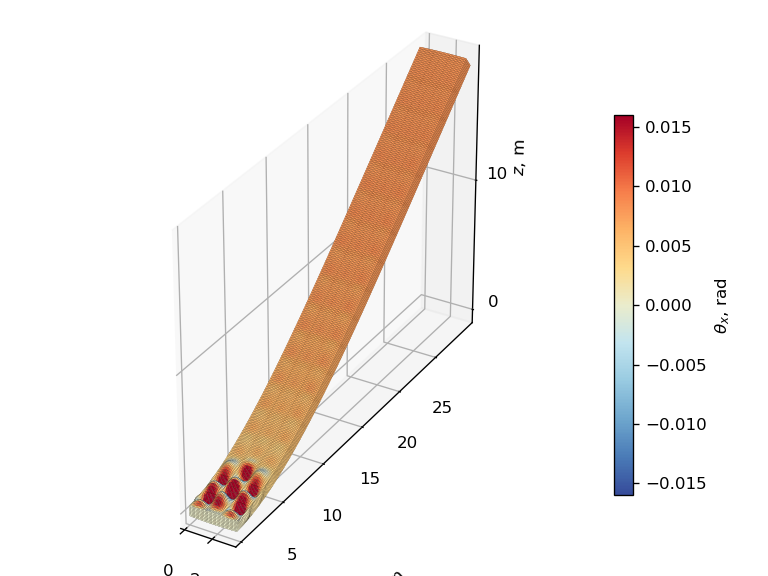

Deformation of point 4:


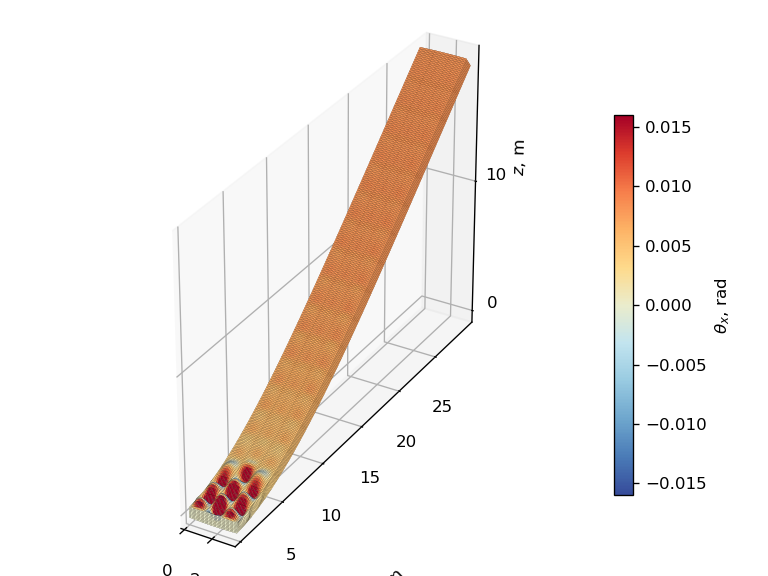

Deformation of point 5:


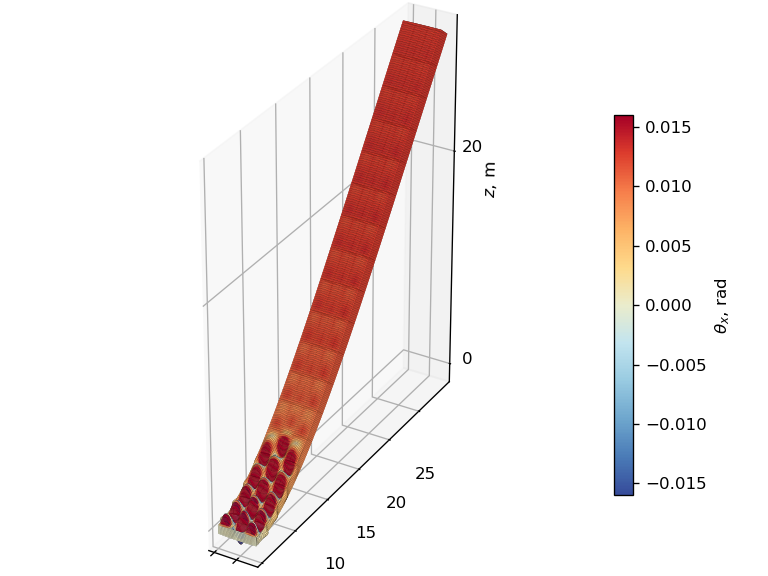

In [17]:
# Plot load-displacement diagram
_, ax = plt.subplots()  # create a figure and set of axes
key = "original mesh"
plot_utils.plot_2d_load_displacements_stability(
    axes=ax,
    displacements=nondimensional_displacements_dict[key]["root"]*100,
    loads=nondimensional_loads_dict[key],
    eigenvalues=eigenvalues_dict[key],
    marker=MARKERS[0], color=COLORS[0])
stable_lines = Line2D([0], [0], linestyle='-', marker=MARKERS[0], color=COLORS[0], label="stable")  # create proxy artist for the legend

# Set legend, axes labels, and grid
ax.legend(handles=[stable_lines, unstable_line])
ax.set_xlabel("$u_{z,\,root}/w$, %")
ax.set_ylabel("$P/P_\mathrm{SOL\/105}$")
ax.grid(visible=True)

# Find index of first negative eigenvalue and index where the structure gets after snap
plot_indices = []  # list to store indices of equilibrium points to plot
for i in [0, 2]:  # loop through the two pairs of load limit points
    index_before_snap = np.where(np.diff((eigenvalues_dict[key] < 0).sum(axis=0)))[0][i]  # find the indices where the number of negative eigenvalues changes
    offset_index = index_before_snap + 10  # offset index to avoid finding the same snap point
    index_after_snap = offset_index + np.argmax(
        nondimensional_loads_dict[key][offset_index:] >= nondimensional_loads_dict[key][index_before_snap])  # find index of closest value to applied load at the first load limit point of the current pair
    plot_indices += [index_before_snap, index_after_snap]  # store indices before and after snap
    
# Add last equilibrium point to list and plot all equilibrium points on load-displacement diagram
plot_indices.append(len(nondimensional_loads_dict[key]) - 1)  # add last index to plot
for count, index in enumerate(plot_indices):  # loop through the equilibrium points to plot
    ax.text(nondimensional_displacements_dict[key]["root"][index]*100, nondimensional_loads_dict[key][index], f"{count + 1}",
            color=COLORS[2], fontsize=12, weight='bold')  # highlight equilibrium point with a number
plt.show()  # show plot

# Plot deformation at selected equilibrium points for refined mesh
clim = [-.016, .016]  # color limits for deformed shape plots
for count, index in enumerate(plot_indices):  # loop through the equilibrium points to plot
    print(f"Deformation of point {count + 1}:")
    _, ax, cbar = plot_utils.plot_deformation(
        op2=sol_106_op2_dict[key], load_step=index, displacement_component='rx', colormap='sunset', length_unit='m',
        unit_scale_factor=1e-3, displacement_amplification_factor=100, clim=clim)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

In [18]:
# Print nondimensional applied load at first limit point
print("Nondimensional applied load at first limit point:")
nondimensional_limit_point_load = {}  # initialize dictionary to store nondimensional load at first limit point
for key in nondimensional_loads_dict:  # loop through the two models
    first_negative_eigenvalue_index = np.where(eigenvalues_dict[key] < 0)[1][0]  # find index of first negative eigenvalue
    nondimensional_limit_point_load[key] = nondimensional_loads_dict[key][first_negative_eigenvalue_index]  # store nondimensional load at first limit point
    print(f"- {key}: {nondimensional_limit_point_load[key]:.2f}")  # print nondimensional load at first limit point
    
# Compute percentage difference of original mesh w.r.t. refined mesh
percentage_diff = (nondimensional_limit_point_load["original mesh"]/nondimensional_limit_point_load["refined mesh"] - 1)*100
print(f"\nPercentage difference of original mesh w.r.t. refined mesh: {percentage_diff:.1f} %")

Nondimensional applied load at first limit point:
- original mesh: 1.11
- refined mesh: 1.10

Percentage difference of original mesh w.r.t. refined mesh: 0.7 %


The limit point load of the original mesh is within 1% to that of the refined mesh, confirming that the original mesh is adequate for our optimization purposes.

## Comparison with the flat skin model <a name="comparison"></a>

***

We want to compare the structural stability response of the CRM-like box beam with curved skins with that of the CRM-like box beam with flat skins. We define the design load equal to the linear buckling load of the model with curved skins. Then we run a linear buckling analysis on the model with flat skins and also a nonlinear analysis applying twice the design load.

In [19]:
# Create mesh with half of the converged target element length
flat_skin_mesh = box_beam_utils.mesh_box_beam_reinforced_with_ribs_and_stiffeners(
        width=W, height=H, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
        stiffeners_height=stiffeners_height, element_length=element_length_converged_mesh)

# Create BDF object
flat_skin_bdf = box_beam_utils.create_base_bdf_input(
    E, nu, rho, t0, flat_skin_mesh.points, flat_skin_mesh.faces.reshape(-1, 5)[:, 1:], parallel=True)

# Create static load subcase applying the design load
flat_skin_bending_bdf = flat_skin_bdf.__deepcopy__({})
apply_distributed_bending_load(flat_skin_bending_bdf, flat_skin_mesh)
DESIGN_LOAD = sol_105_buckling_load
flat_skin_bending_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[DESIGN_LOAD], load_ids=[FORCE_SET_ID])

subcase=0 already exists...skipping


LOAD          12      1.  39823.      11

Run linear buckling analysis, print buckling load factor and plot critical buckling mode.

Nastran job sol_105_flat_initial.bdf completed
Wall time: 14.0 s
P_SOL 105/P_design = 0.76
Critical buckling mode:


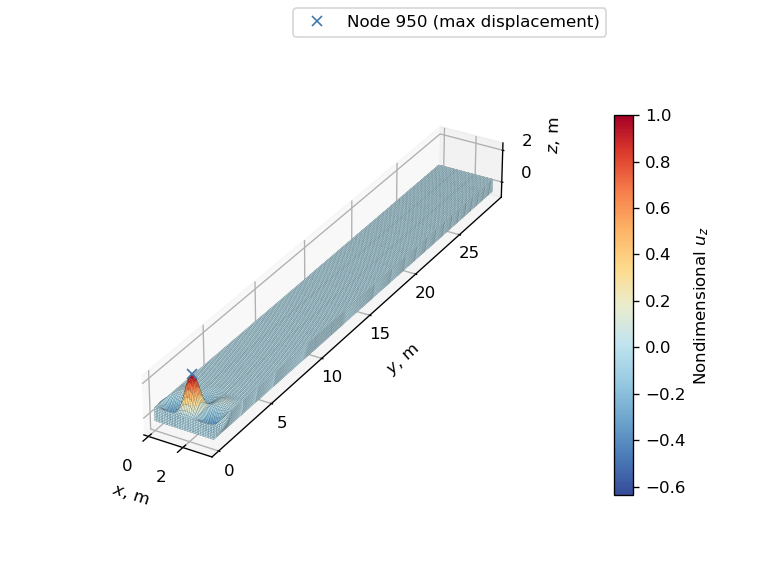

In [20]:
# Run SOL 105 for model with flat skins
flat_skin_bending_sol_105_bdf = flat_skin_bending_bdf.__deepcopy__({})
input_name = f"sol_105_flat_initial"
sol_105_op2 = pynastran_utils.run_sol_105(
    bdf=flat_skin_bending_sol_105_bdf, static_load_set_id=LOAD_SET_ID,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name, run_flag=False)

# Print buckling load factor
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot critical buckling mode
print(f"Critical buckling mode:")
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
key = "flat skins"
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
root_node_id_dict[key] = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[
    root_node_id_dict[key]].xyz*1e-3 + sol_105_op2.eigenvectors[
        SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {root_node_id_dict[key]:d} (max displacement)", zorder=4)
ax.legend()  # add legend
adjust_3d_plot(ax, cbar)  # adjust plot appearance
plt.show()  # show plot

Run nonlinear analysis.

In [21]:
# Create static load case applying twice the design load
flat_skin_bending_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2*DESIGN_LOAD
pynastran_utils.create_static_load_subcase(
    bdf=flat_skin_bending_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)

# Setup SOL 106 with arc-length method using parameters for fine resolution of equilibrium path
pynastran_utils.set_up_arc_length_method(bdf=flat_skin_bending_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-6, max_bisect=20,
                                         minalr=1e-5, desiter=4, maxinc=400)

# Run analysis
input_name = "sol_106_flat_initial"
sol_106_op2_dict[key] = pynastran_utils.run_sol_106_with_kllrh_eigenvalues(
    bdf=flat_skin_bending_bdf, method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name, upper_eig=UPPER_EIGENVALUE, run_flag=False)

Nastran job sol_106_flat_initial.bdf completed
Wall time: 28528.0 s


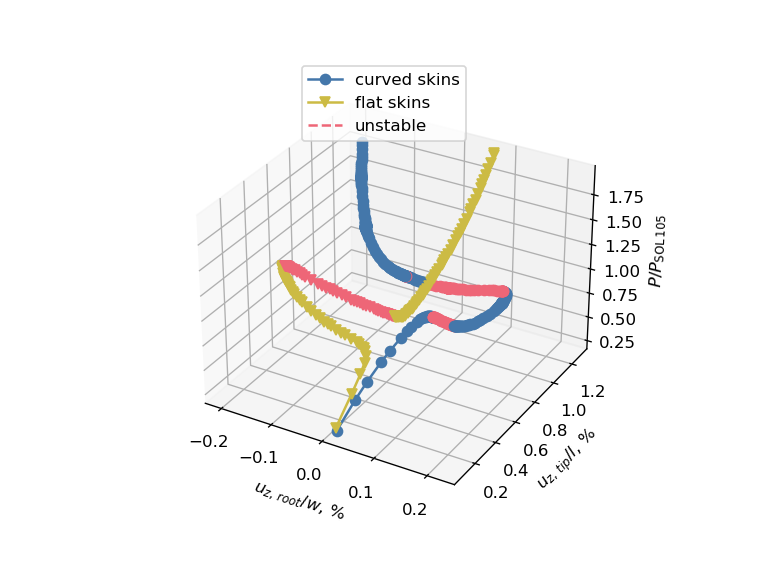

In [22]:
# Read eigenvalues, applied loads and displacements
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file
tip_node_id_dict[key] = np.argmin(np.linalg.norm(flat_skin_mesh.points - tip_node_xyz, axis=1)) + 1
flat_skin_plot_nodes_ids = [root_node_id_dict[key], tip_node_id_dict[key]]  # list of node ids to plot for model with flat skins
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=flat_skin_plot_nodes_ids)

# Nondimensionalize loads and displacments
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD
nondimensional_displacements_dict[key] = {"root": displacements[flat_skin_plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
                                          "tip": displacements[flat_skin_plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Create 3D plot of equilibrium diagram
fig = plt.figure()  # create a figure
ax_3d = plt.axes(projection="3d")  # create 3D axes
stable_lines = []  # list to store proxy artists for the legend
mapping_dict = {"original mesh": "curved skins", "flat skins": "flat skins"}
for count, (key, label) in enumerate(mapping_dict.items()):  # loop through the different meshes
    
    # Plot load-displacement curve
    plot_utils.plot_3d_load_displacements_stability(
        axes=ax_3d,
        displacements1=nondimensional_displacements_dict[key]["root"]*100,
        displacements2=nondimensional_displacements_dict[key]["tip"]*100,
        loads=nondimensional_loads_dict[key],
        eigenvalues=eigenvalues_dict[key],
        marker=MARKERS[count], color=COLORS[count])
    stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[count], color=COLORS[count], label=label))  # create proxy artist for the legend

# Add legend, axes labels, and grid
fig.legend(handles=stable_lines + [unstable_line], loc="upper center", bbox_to_anchor=(0.5, 0.9))
ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")
ax_3d.grid(visible=True)
plt.show()

## Linear buckling optimization <a name="linear"></a>

***

### Curved skins <a name="linear-curved"></a>

We start by creating the mesh using the target element lenght found in the mesh convergence study and we create our base `BDF` object.

In [23]:
curved_skin_sol_105_bdf = curved_skin_bdf.__deepcopy__({})
curved_skin_sol_105_bdf.case_control_deck.subcases[0].add_result_type('STRESS', 'ALL', ['PLOT'])  # store stress results of all elements in the op2 file

Analogously to our [last notebook](20_Two-variables_Optimization_of_the_CRM-like_Box_Beam.ipynb), we define the thickness to be constant over each rib and box segment (defined between two consecutive ribs), and we define a linear variation of the thickness between the root and the tip rib.

![Thickness patches of the CRM-like box beam.](resources/20_ThicknessPatches.svg "Thickness patches of the CRM-like box beam.")

To achieve this, we need to assign a different `PSHELL` card to each box segment and to each rib. We can do this by calling the function `define_property_segments` from the `box_beam_utils` module.

In [24]:
box_beam_utils.define_property_segments(bdf=curved_skin_sol_105_bdf, ribs_y_locations=ribs_y_locations)

Successively we apply the non-follower forces to our model using the function `apply_non_follower_elliptical_load`.

In [25]:
apply_distributed_bending_load(curved_skin_sol_105_bdf, curved_skin_mesh)

Analogously to our previous notebooks, we define the design load of the structure to be equal to its linear buckling load.

In [26]:
curved_skin_sol_105_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[DESIGN_LOAD], load_ids=[FORCE_SET_ID])  # add LOAD card

LOAD          12      1.  39823.      11

To define our optimization problem within the OpenMDAO framework we start by instantiating a `NastranGroup` object. This object creates the internal `NastranSolver` component, which receives the thickness distribution as input and runs the Nastran analysis to calculate the objective and the constraint functions. Then we set up the `BDF` object for the linear buckling analysis with SOL 105 calling the function `setup_sol_105` from the `pynastran_utils` module. Successively, we define the linear variation of the thickness between the root and the tip rib by means of a spline component, and we connect this to the appropriate input of the `NastranSolver` component. Finally, we instantiate a `Problem` object and we set up the optimization problem hierarchy, variables and connections. 

In [27]:
from resources import optimization_utils  # import optimization_utils module from resources folder
import openmdao.api as om  # make available the most common OpenMDAO classes and functions

# Define NastranGroup object
input_name = "sol_105_curved_linear_opt_start"  # default name of input file
pynastran_utils.set_up_sol_105(bdf=curved_skin_sol_105_bdf, static_load_set_id=LOAD_SET_ID, no_eigenvalues = NO_EIGENVALUES)  # set up SOL 105
sol_105_group = optimization_utils.NastranGroup(
    bdf=curved_skin_sol_105_bdf, yield_strength=SIGMA_Y, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    eigenvalue_scaling_factor=EIGENVALUE_SCALING_FACTOR, run_flag=False)  # create NastranGroup object

# Define spline component and connect it to the NastranSolver component
box_segments_eval_y_locations = ribs_y_locations[0:-1] + np.ediff1d(ribs_y_locations)/2  # y-coordinates of the thickness evaluation points for each box segment
x_interp = np.sort(np.concatenate((ribs_y_locations, box_segments_eval_y_locations)))  # combine and sort the y-coordinates of the control points of the stiffened box patches and the ribs
interp_comp = om.SplineComp(method='slinear', x_cp_val=np.array([0, L]), x_interp_val=x_interp)  # create linear spline component
interp_comp.add_spline(y_cp_name='t_cp', y_interp_name='t_val')  # add spline variables to the component
sol_105_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the NastranSolver component input

# Set up optimization problem
curved_skin_linear_problem = om.Problem(model=sol_105_group, name="sol_105_curved")
curved_skin_linear_problem.setup()

Now we assign the initial thickness distribution (constant) and we run our model to record the objective and the constraint functions of the initial design.

In [28]:
# Assign initial thickness and run model
initial_thickness_vector = t0*np.ones(2)  # constant initial thickness
curved_skin_linear_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign initial thickness vector to input of spline component
curved_skin_linear_problem.run_model()  # run the model

# Store and print initial mass and KS values
mass_0 = curved_skin_linear_problem['nastran_solver.mass'][0]
ks_buckling_0 = curved_skin_linear_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = curved_skin_linear_problem['nastran_solver.ks_stress'][0]
print("Initial thickness vector [mm]:")
print(initial_thickness_vector)
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.3f}
Initial KS value for stress: {ks_stress_0:.0f} MPa
Initial mass: {mass_0*1e3:.0f} kg""")

Nastran job sol_105_curved_linear_opt_start.bdf completed
Wall time: 23.0 s
Initial thickness vector [mm]:
[7.7 7.7]
Initial KS value for buckling load factor: -0.000
Initial KS value for stress: -393 MPa
Initial mass: 6617 kg


We're almost ready to run the optimization! We define the default parameters for our `NastranGroup` object, choose COBYLA as optimization algorithm, add design variables, objective and constraints to the `Problem` object and add a recorder to the optimizer to store the optimization history. Finally, we run the optimization and we visualize the convergence history.

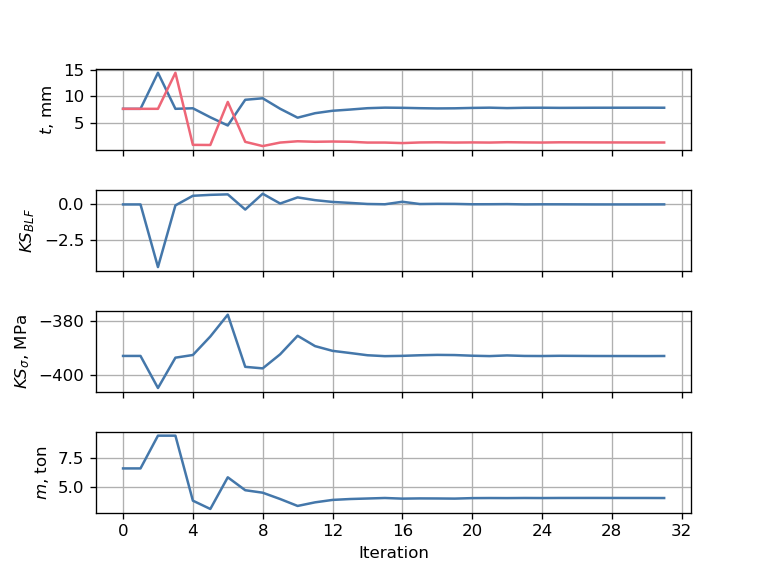

Design variables, constraints and objective at last iteration:
- interp.t_cp: [7.902 1.439]
- nastran_solver.ks_buckling: [0.004]
- nastran_solver.ks_stress: [-392.827]
- nastran_solver.mass: [4.013]


In [29]:
# Set default initial thickness vector and name of input file
curved_skin_linear_problem.model.set_input_defaults('interp.t_cp', initial_thickness_vector)
input_name = "sol_105_curved_linear_opt"  # default name of input file
curved_skin_linear_problem.model.options['input_name'] = input_name

# Choose optimizer
curved_skin_linear_problem.driver = om.ScipyOptimizeDriver()
curved_skin_linear_problem.driver.options['optimizer'] = 'COBYLA'
OPTIMIZER_TOLERANCE = 1e-3  # tolerance for optimizer
curved_skin_linear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
thickness_bounds = [1., 20.]  # [mm]
curved_skin_linear_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
curved_skin_linear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
curved_skin_linear_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
curved_skin_linear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
curved_skin_linear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
curved_skin_linear_problem.setup()  # re-setup problem before running optimization
curved_skin_linear_problem.set_solver_print(0)  # disable solver output
curved_skin_linear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    curved_skin_linear_problem.run_driver()  # run optimization
curved_skin_linear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, curved_skin_linear_opt_histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history

Optimization does not end on a feasible design, so we need to find the last feasible iteration to print the final values of design variables, constraints and objective.

In [30]:
# Find index of last feasible design
feasible_design_index = np.where(curved_skin_linear_opt_histories['nastran_solver.ks_buckling'][:, 0] < OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in curved_skin_linear_opt_histories:
    print(f"- {key}: {curved_skin_linear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (curved_skin_linear_opt_histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
print(f"Mass variation w.r.t. initial structure: {mass_percentage_variation:.1f} %")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [7.906 1.443]
- nastran_solver.ks_buckling: [0.001]
- nastran_solver.ks_stress: [-392.843]
- nastran_solver.mass: [4.017]
Mass variation w.r.t. initial structure: -39.3 %


Run analysis of last feasible design and plot critical buckling mode of the optimized structure.

Nastran job sol_105_curved_linear_opt.bdf completed
Wall time: 24.0 s


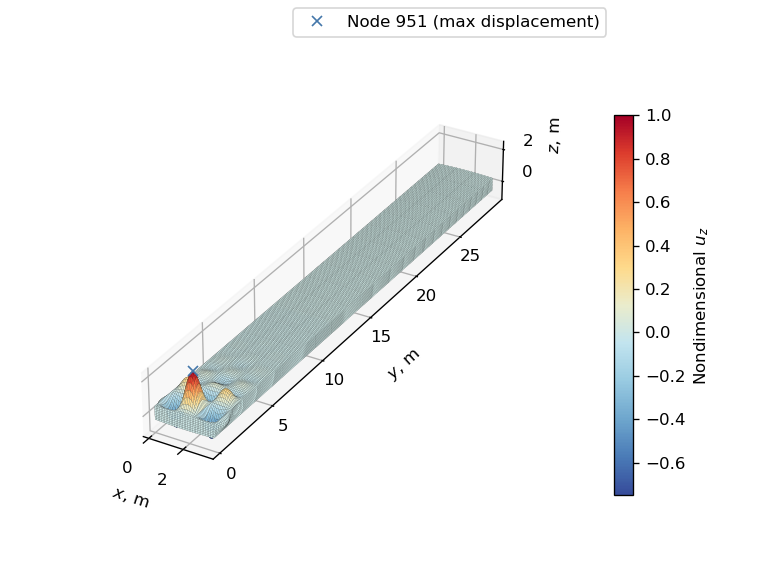

In [31]:
# Run analysis of last feasible design
curved_skin_linear_opt_thickness_array = curved_skin_linear_opt_histories['interp.t_cp'][feasible_design_index]
curved_skin_linear_problem.set_val('interp.t_cp', curved_skin_linear_opt_thickness_array)
curved_skin_linear_problem.run_model()

# Read op2 file of linear buckling analysis
sol_105_op2 = curved_skin_linear_problem['nastran_solver.op2']

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to 

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear response of linearly optimized structure

Set up OpenMDAO problem with nonlinear analysis.

In [32]:
# Request nonlinear stress results of all elements in the op2 file
curved_skin_sol_106_bdf.case_control_deck.subcases[0].add_result_type('NLSTRESS', 'ALL', ['PLOT'])

# Define property segments
box_beam_utils.define_property_segments(bdf=curved_skin_sol_106_bdf, ribs_y_locations=ribs_y_locations)

# Create NastranGroup object
input_name = "sol_106_curved_linear_opt"
sol_106_group = optimization_utils.NastranGroup(
    bdf=curved_skin_sol_106_bdf, yield_strength=SIGMA_Y, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    eigenvalue_scaling_factor=EIGENVALUE_SCALING_FACTOR, run_flag=False)  # create NastranGroup object

# Add spline component and connect it to the NastranSolver component
sol_106_group.add_subsystem('interp', interp_comp)
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up optimization problem
curved_skin_nonlinear_problem = om.Problem(model=sol_106_group, name="sol_106_curved")
curved_skin_nonlinear_problem.setup()

Applied twice the design load, assign thickness resulting from linear buckling optimization and run model.

In [33]:
curved_skin_sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD*2    # scale load to twice the design load
curved_skin_nonlinear_problem.set_val('interp.t_cp', curved_skin_linear_opt_thickness_array)  # assign thickness array to spline component input
curved_skin_nonlinear_problem.run_model()  # run analysis

Nastran job sol_106_curved_linear_opt.bdf completed
Wall time: 32052.0 s


Plot eigenvalues of tangent stiffness matrix.

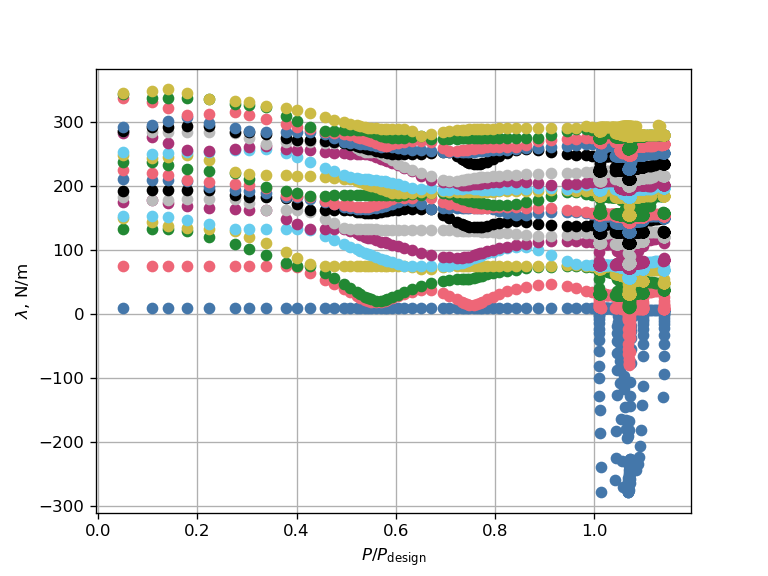

Nondimensional applied load at first limit point: 1.05


In [34]:
# Retrieve OP2 object of nonlinear analysis
key = "linearly optimized structure"
sol_106_op2_dict[key] = curved_skin_nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
curved_skin_plot_nodes_ids = [root_node_id_dict["original mesh"], tip_node_id_dict["original mesh"]]  # list of node ids to plot for model with curved skins
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=curved_skin_plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot eigenvalues vs cumulative sum of absolute value of load increments.

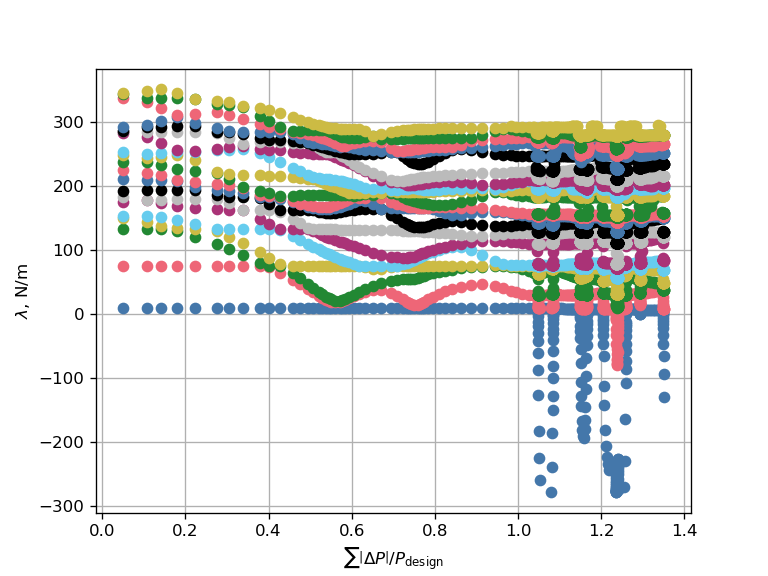

In [35]:
_, ax = plt.subplots()
cumsum_nondimensional_loads = np.cumsum(np.abs(np.diff(np.insert(nondimensional_loads_dict[key][:-1], 0, 0.))))  # cumulative sum of load increments
ax.plot(cumsum_nondimensional_loads, eigenvalues_dict[key].T*1e3, 'o')  # convert eigenvalues from N/mm to N/m
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel(r"$\sum \left|\Delta P\right|/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Plot load-displacement diagrams for initial and linearly optimized structure.

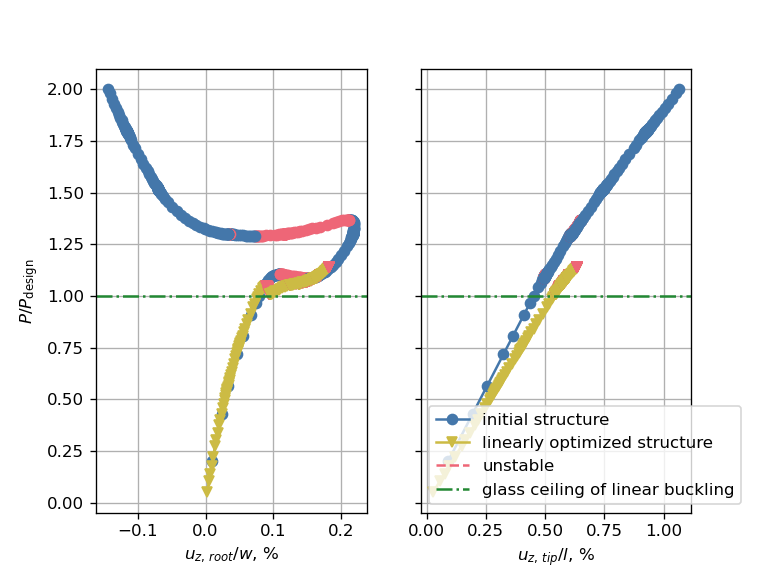

In [36]:
# Duplicate results of the original mesh into new ditionary key
nondimensional_loads_dict["initial structure"] = nondimensional_loads_dict["original mesh"]
nondimensional_displacements_dict["initial structure"] = nondimensional_displacements_dict["original mesh"]
eigenvalues_dict["initial structure"] = eigenvalues_dict["original mesh"]

# Nondimensionalize displacements of the linearly optimized structure
nondimensional_displacements_dict[key] = {
    "root": displacements[curved_skin_plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[curved_skin_plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
displacement_labels = ["root", "tip"]  # labels for the displacements
reference_lengths = ["w", "l"]  # reference lengths for the displacements
design_labels = ["initial structure", "linearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(
            axes[ax_index],
            nondimensional_displacements_dict[design_key][displacement_key]*100,
            nondimensional_loads_dict[design_key],
            eigenvalues_dict[design_key],
            MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=1, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="glass ceiling of linear buckling")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [unstable_line, glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load.

Deformation at design load of initial structure:


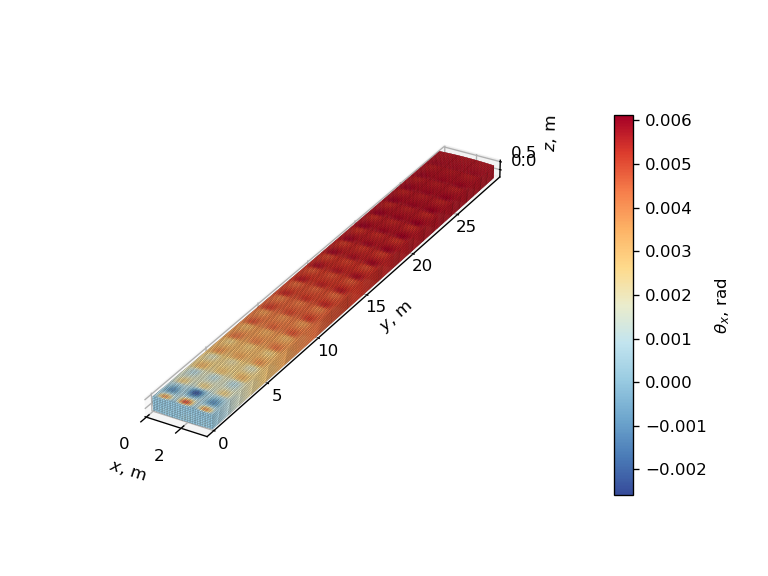

Deformation at design load of linearly optimized structure:


c:\Users\qa21944\Github\phd-jupyter-notebooks\notebooks\resources\plot_utils.py:316: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


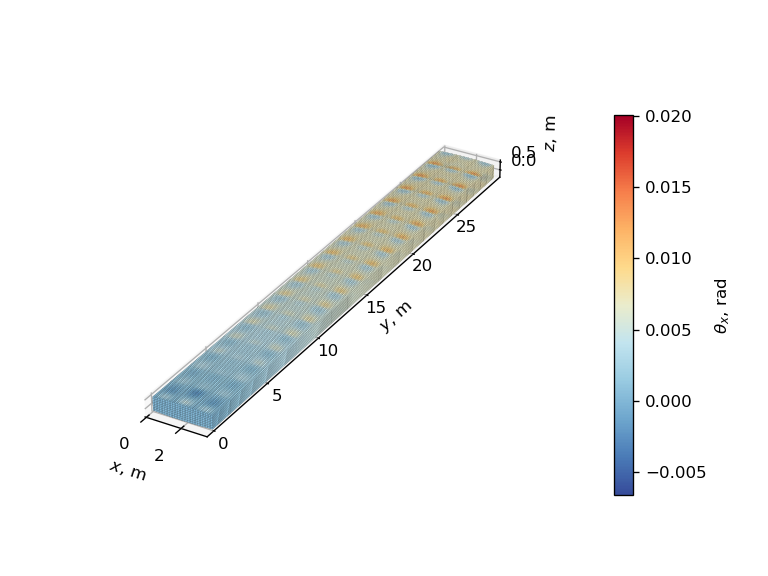

In [37]:
sol_106_op2_dict["initial structure"] = sol_106_op2_dict["original mesh"]  # duplicate results of the original mesh into new ditionary key
for key in ["initial structure", "linearly optimized structure"]:  # loop through the initial and linearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = plot_utils.plot_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

### Flat skins <a name="linear-flat"></a>

Request stress output and define property patches.

In [38]:
flat_skin_bending_sol_105_bdf.case_control_deck.subcases[0].add_result_type('STRESS', 'ALL', ['PLOT'])  # store stress results of all elements in the op2 file
box_beam_utils.define_property_segments(bdf=flat_skin_bending_sol_105_bdf, ribs_y_locations=ribs_y_locations)

Set up OpenMDAO problem.

In [39]:
# Define NastranGroup object
input_name = "sol_105_flat_linear_opt_start"  # default name of input file
sol_105_group = optimization_utils.NastranGroup(
    bdf=flat_skin_bending_sol_105_bdf, yield_strength=SIGMA_Y, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    eigenvalue_scaling_factor=EIGENVALUE_SCALING_FACTOR, run_flag=False)  # create NastranGroup object

# Define spline component and connect it to the NastranSolver component
sol_105_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the NastranSolver component input

# Set up optimization problem
flat_skin_linear_problem = om.Problem(model=sol_105_group, name="sol_105_flat")
flat_skin_linear_problem.setup()

Assign initial thickness, run model and store initial objective and constraint values.

In [40]:
# Assign initial thickness and run model
initial_thickness_vector = t0*np.ones(2)  # constant initial thickness
flat_skin_linear_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign initial thickness vector to input of spline component
flat_skin_linear_problem.run_model()  # run the model

# Store and print initial mass and KS values
mass_0 = flat_skin_linear_problem['nastran_solver.mass'][0]
ks_buckling_0 = flat_skin_linear_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = flat_skin_linear_problem['nastran_solver.ks_stress'][0]
print("Initial thickness vector [mm]:")
print(initial_thickness_vector)
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.3f}
Initial KS value for stress: {ks_stress_0:.0f} MPa
Initial mass: {mass_0*1e3:.0f} kg""")

Nastran job sol_105_flat_linear_opt_start.bdf completed
Wall time: 14.0 s
Initial thickness vector [mm]:
[7.7 7.7]
Initial KS value for buckling load factor: 0.236
Initial KS value for stress: -388 MPa
Initial mass: 6519 kg


Set up and run optimization, and plot optimization history.

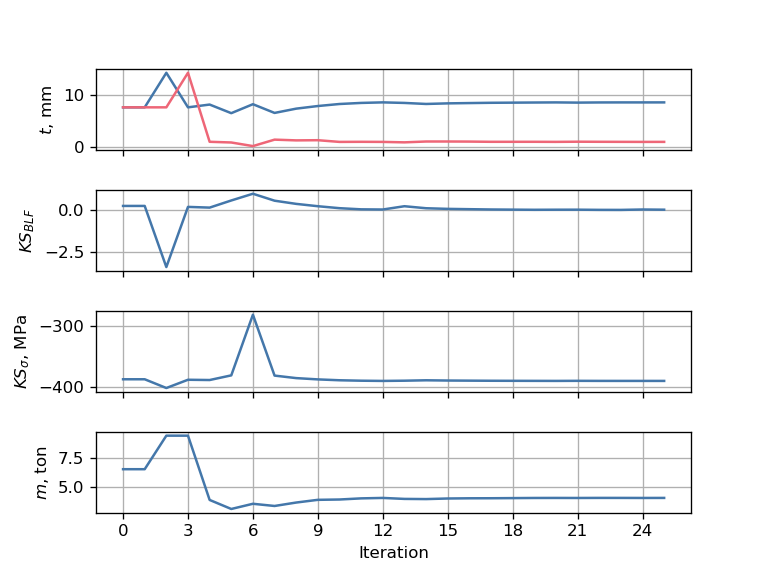

Design variables, constraints and objective at last iteration:
- interp.t_cp: [8.66  1.005]
- nastran_solver.ks_buckling: [0.013]
- nastran_solver.ks_stress: [-390.568]
- nastran_solver.mass: [4.091]


In [41]:
# Set default initial thickness vector and name of input file
flat_skin_linear_problem.model.set_input_defaults('interp.t_cp', initial_thickness_vector)
input_name = "sol_105_flat_linear_opt"  # default name of input file
flat_skin_linear_problem.model.options['input_name'] = input_name

# Choose optimizer
flat_skin_linear_problem.driver = om.ScipyOptimizeDriver()
flat_skin_linear_problem.driver.options['optimizer'] = 'COBYLA'
flat_skin_linear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
thickness_bounds = [1., 20.]  # [mm]
flat_skin_linear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
flat_skin_linear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
flat_skin_linear_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
flat_skin_linear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
flat_skin_linear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
flat_skin_linear_problem.setup()  # re-setup problem before running optimization
flat_skin_linear_problem.set_solver_print(0)  # disable solver output
flat_skin_linear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    flat_skin_linear_problem.run_driver()  # run optimization
flat_skin_linear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, flat_skin_linear_opt_histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history

Optimization does not end on a feasible design, so we need to find the last feasible iteration to print the final values of design variables, constraints and objective.

In [42]:
# Find index of last feasible design
feasible_design_index = np.where(flat_skin_linear_opt_histories['nastran_solver.ks_buckling'][:, 0] < OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in flat_skin_linear_opt_histories:
    print(f"- {key}: {flat_skin_linear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (flat_skin_linear_opt_histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
print(f"Mass variation w.r.t. initial structure: {mass_percentage_variation:.1f} %")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [8.656 1.01 ]
- nastran_solver.ks_buckling: [-0.]
- nastran_solver.ks_stress: [-390.556]
- nastran_solver.mass: [4.092]
Mass variation w.r.t. initial structure: -37.2 %


Run analysis of last feasible design and plot critical buckling mode of linearly optimized structure.

Nastran job sol_105_flat_linear_opt.bdf completed
Wall time: 34.0 s


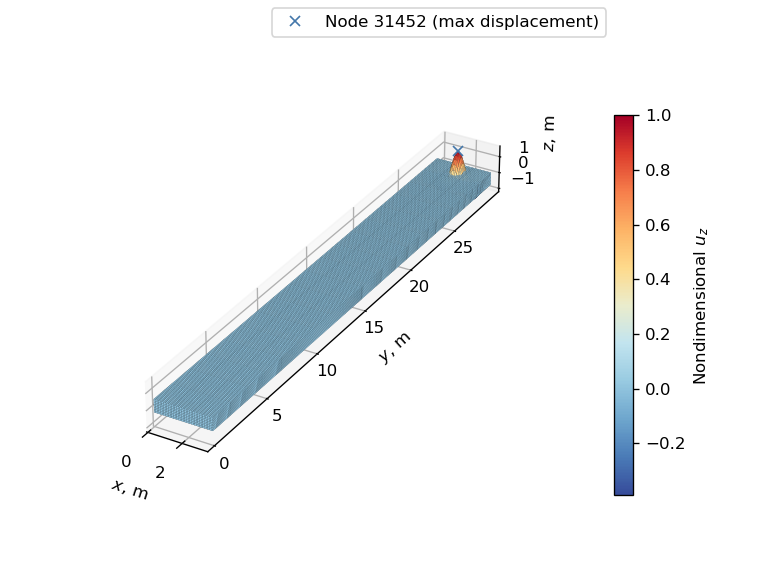

In [43]:
# Run analysis of last feasible design
flat_skin_linear_opt_thickness_array = flat_skin_linear_opt_histories['interp.t_cp'][feasible_design_index]
flat_skin_linear_problem.set_val('interp.t_cp', flat_skin_linear_opt_thickness_array)
flat_skin_linear_problem.run_model()

# Retrieve OP2 object from problem outputs
sol_105_op2 = flat_skin_linear_problem['nastran_solver.op2']

# Read op2 file of linear buckling analysis
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2 = read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear response of linearly optimized structure

Set up OpenMDAO problem with nonlinear analysis.

In [44]:
# Request nonlinear stress results of all elements in the op2 file
flat_skin_bending_bdf.case_control_deck.subcases[0].add_result_type('NLSTRESS', 'ALL', ['PLOT'])

# Define property segments
box_beam_utils.define_property_segments(bdf=flat_skin_bending_bdf, ribs_y_locations=ribs_y_locations)

# Create NastranGroup object
input_name = "sol_106_flat_linear_opt"
sol_106_group = optimization_utils.NastranGroup(
    bdf=flat_skin_bending_bdf, yield_strength=SIGMA_Y, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    eigenvalue_scaling_factor=EIGENVALUE_SCALING_FACTOR, run_flag=False)

# Define spline component and connect it to the NastranSolver component
sol_106_group.add_subsystem('interp', interp_comp)
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up optimization problem
flat_skin_nonlinear_problem = om.Problem(model=sol_106_group, name="sol_106_flat")
flat_skin_nonlinear_problem.setup()

Set thickness distribution of linearly optimized structure, apply twice the design load and run model.

In [45]:
flat_skin_nonlinear_problem.set_val('interp.t_cp', flat_skin_linear_opt_thickness_array)  # assign thickness array to spline component input
flat_skin_bending_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD*2  # scale load to twice the design load
flat_skin_nonlinear_problem.run_model()  # run analysis

Nastran job sol_106_flat_linear_opt.bdf completed
Wall time: 10234.0 s


Plot eigenvalue diagram.

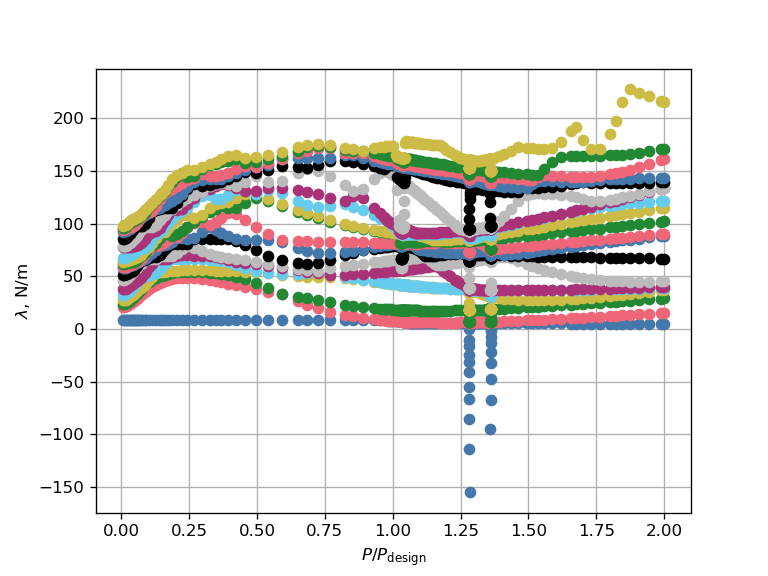

Nondimensional applied load at first limit point: 1.36


In [46]:
# Retrieve OP2 object of nonlinear analysis
key = "flat skins"
sol_106_op2_dict[key] = flat_skin_nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=flat_skin_plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Compare load displacement diagram of linearly optimized structures with curved and flat skins.

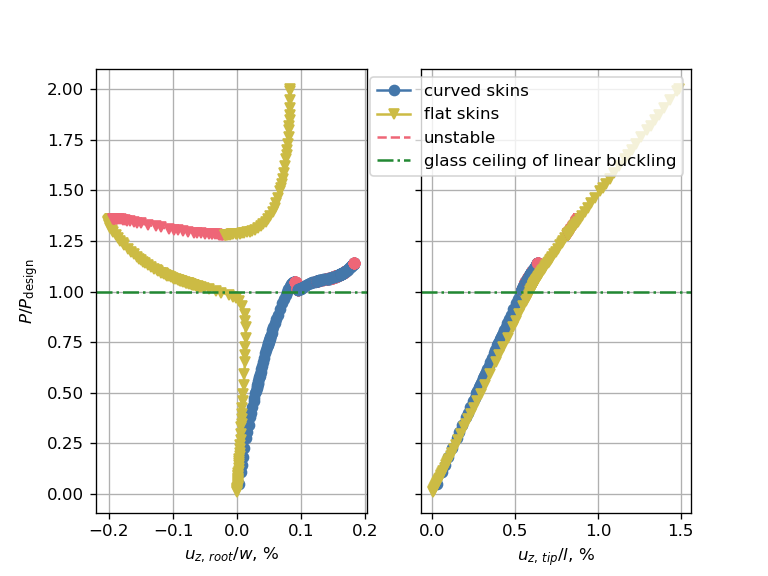

In [47]:
# Nondimensionalize displacements of linearly optimized structure with flat skins
nondimensional_displacements_dict[key] = {"root": displacements[flat_skin_plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
                                          "tip": displacements[flat_skin_plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
mapping_dict = {"curved skins": "linearly optimized structure", "flat skins": "flat skins"}  # dictonaries to map the keys
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, (label, design_key) in enumerate(mapping_dict.items()):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(
            axes[ax_index],
            nondimensional_displacements_dict[design_key][displacement_key]*100,
            nondimensional_loads_dict[design_key],
            eigenvalues_dict[design_key],
            MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=label))  # create proxy artist for the legend
    axes[ax_index].axhline(y=1, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
axes[1].legend(handles=stable_lines + [unstable_line, glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load.

Deformation at design load of curved skins:


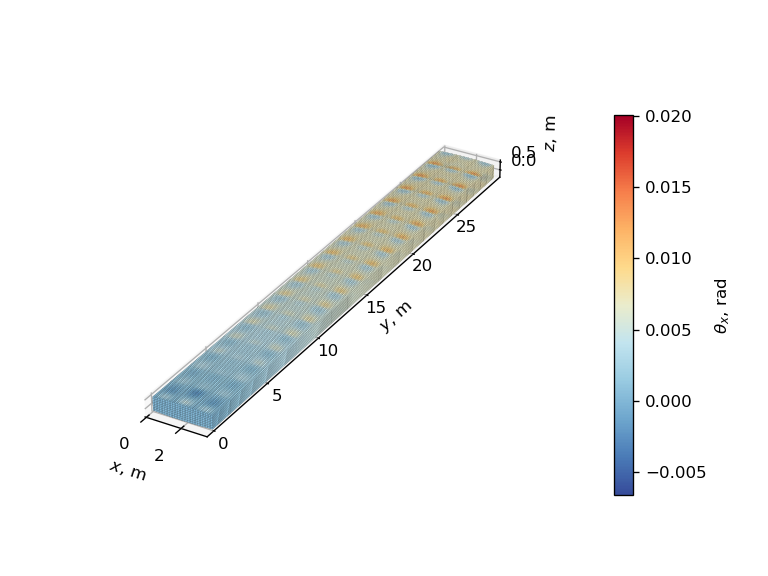

Deformation at design load of flat skins:


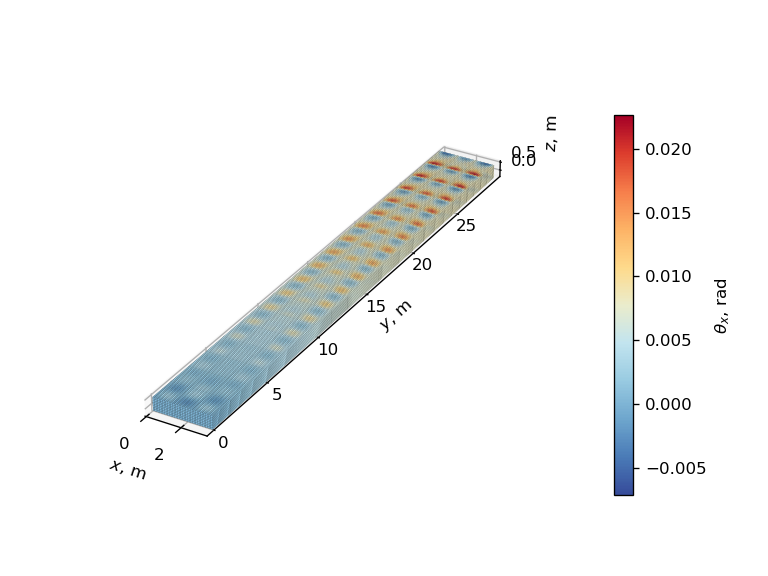

In [48]:
for design_label, design_key in mapping_dict.items():  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {design_label}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[design_key] - 1))  # find index of design load
    _, ax, cbar = plot_utils.plot_deformation(
        op2=sol_106_op2_dict[design_key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m',
        unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

## Nonlinear structural stability optimization <a name="nonlinear"></a>

***

### Curved skins <a name="nonlinear-curved"></a>

Modify maximum number of increments, applied load and name of input file of existing OpenMDAO problem, and run model to record the objective and the constraint functions of the initial design.

In [49]:
# Scale load to design load, change DMAP and run model
curved_skin_sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD  # scale load to design load
dmap_stop = curved_skin_sol_106_bdf.executive_control_lines[1].replace("nobuckle", "stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
curved_skin_sol_106_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to store eigenvectors
curved_skin_nonlinear_problem.model.nastran_solver.options['input_name'] = "sol_106_curved_nonlinear_opt_start"
curved_skin_nonlinear_problem.run_model()

# Store and print initial KS values and mass
ks_stability_0 = curved_skin_nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = curved_skin_nonlinear_problem["nastran_solver.ks_stress"][0]
mass_0 = curved_skin_nonlinear_problem['nastran_solver.mass'][0]
print(f"""Initial KS value for stability: {ks_stability_0:.3f} N/m
Initial KS value for stress: {ks_stress_0:.0f} MPa
Initial mass: {mass_0*1e3:.0f} kg""")

Nastran job sol_106_curved_nonlinear_opt_start.bdf completed
Wall time: 1583.0 s
Initial KS value for stability: -8.963 N/m
Initial KS value for stress: -393 MPa
Initial mass: 4017 kg


Set initial thickness distribution equal to that of the linearly optimized structure, run optimization and plot convergence history.

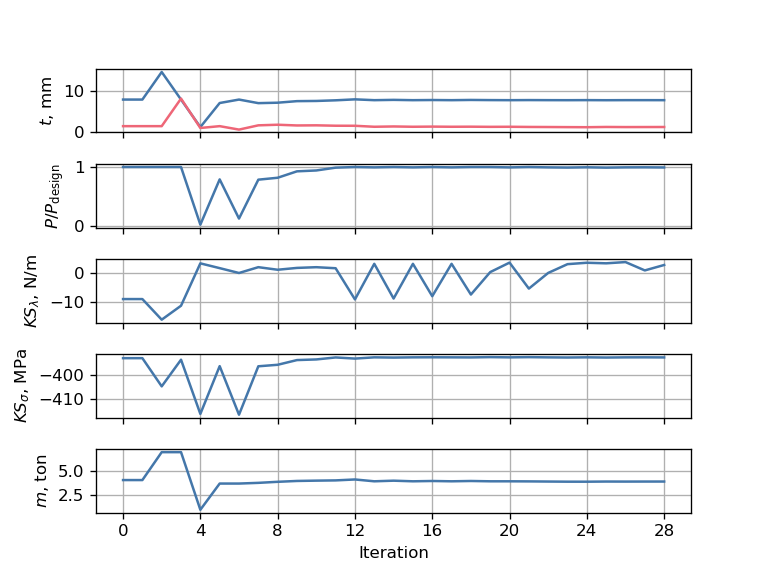

Design variables, constraints and objective at last iteration:
- interp.t_cp: [7.758 1.237]
- nastran_solver.applied_load: [0.993]
- nastran_solver.ks_stability: [2.825]
- nastran_solver.ks_stress: [-392.472]
- nastran_solver.mass: [3.865]


In [50]:
# Set default input values of sol_106 component
curved_skin_nonlinear_problem.model.set_input_defaults('interp.t_cp', curved_skin_linear_opt_thickness_array)
input_name = "sol_106_curved_nonlinear_opt"
curved_skin_nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
curved_skin_nonlinear_problem.driver = om.ScipyOptimizeDriver()
curved_skin_nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
curved_skin_nonlinear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
curved_skin_nonlinear_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
curved_skin_nonlinear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
curved_skin_nonlinear_problem.model.add_constraint('nastran_solver.ks_stability', upper=0., ref=np.abs(ks_stability_0))  # scale KS function for nonlinear structural stability so that the initial value is 1
curved_skin_nonlinear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
curved_skin_nonlinear_problem.model.add_constraint('nastran_solver.load_factor', lower=DESIGN_LOAD*.99, ref=DESIGN_LOAD)  # scale applied load so that design

# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
curved_skin_nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
curved_skin_nonlinear_problem.setup()  # re-setup problem
curved_skin_nonlinear_problem.set_solver_print(0)  # disable solver output
curved_skin_nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    curved_skin_nonlinear_problem.run_driver()  # run optimization
curved_skin_nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, curved_skin_nonlinear_opt_histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history


Find last feasible design and print results.

In [51]:
# Find index of last feasible design
feasible_design_index = np.where(curved_skin_nonlinear_opt_histories['nastran_solver.ks_stability'][:, 0] < OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in curved_skin_nonlinear_opt_histories:
    print(f"- {key}: {curved_skin_nonlinear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (curved_skin_nonlinear_opt_histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
print(f"Mass variation w.r.t. linearly optimized structure: {mass_percentage_variation:.1f} %")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [7.782 1.251]
- nastran_solver.applied_load: [1.]
- nastran_solver.ks_stability: [-5.342]
- nastran_solver.ks_stress: [-392.351]
- nastran_solver.mass: [3.881]
Mass variation w.r.t. linearly optimized structure: -3.4 %


Run analysis at last feasible design and plot eigenvalues of tangent stiffness matrix.

Nastran job sol_106_curved_nonlinear_opt.bdf completed
Wall time: 3625.0 s


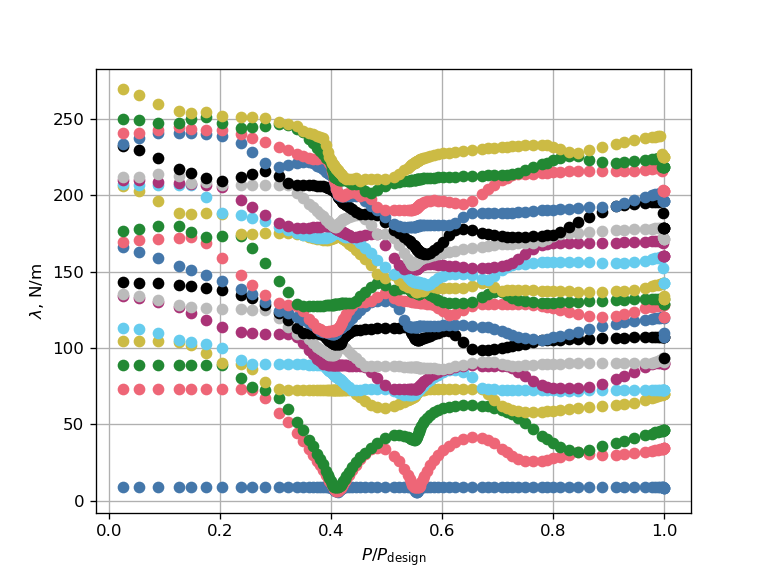

In [52]:
# Run analysis of last feasible design
curved_skin_nonlinear_opt_thickness_array = curved_skin_nonlinear_opt_histories['interp.t_cp'][feasible_design_index]
curved_skin_nonlinear_problem.set_val('interp.t_cp', curved_skin_nonlinear_opt_thickness_array)
curved_skin_nonlinear_problem.run_model()

# Read load and displacement history
key = "nonlinearly optimized structure"
sol_106_op2_dict[key] = curved_skin_nonlinear_problem['nastran_solver.op2']
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=curved_skin_plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Calculate linear buckling load of nonlinearly optimized structure.

Nastran job sol_105_curved_nonlinear_opt.bdf completed
Wall time: 23.0 s
P_SOL 105/P_design = 0.69
Critical buckling mode:


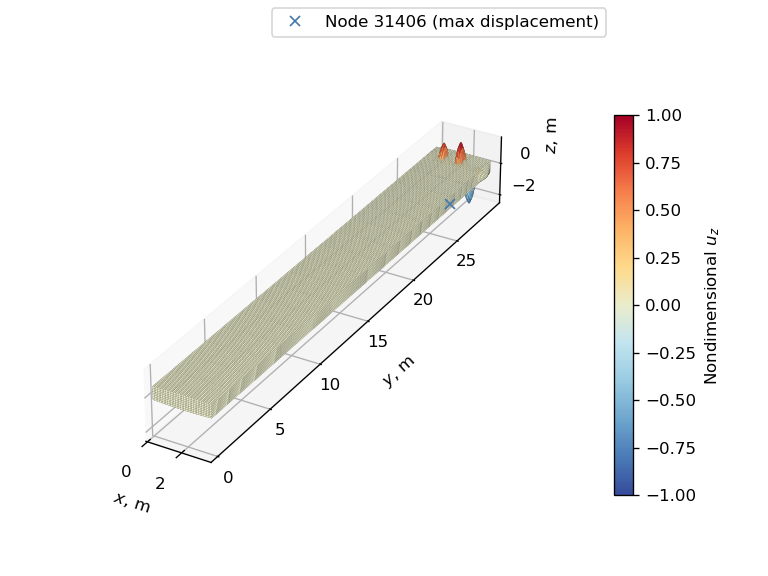

In [53]:
# Modify name of bdf file and input thicknesses and run analysis
curved_skin_linear_problem.model.options['input_name'] = "sol_105_curved_nonlinear_opt"
curved_skin_linear_problem.setup()
curved_skin_linear_problem.set_val('interp.t_cp', curved_skin_nonlinear_opt_thickness_array)
curved_skin_linear_problem.run_model()

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = curved_skin_linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Plot node where max displacement occurs and add legend
plot_utils.plot_max_displacement_node(ax, sol_105_op2, unit_scale_factor=1e-3, displacement_amplification_factor=amplification_factor)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot load-displacement diagrams for linearly and nonlinearly optimized structure.

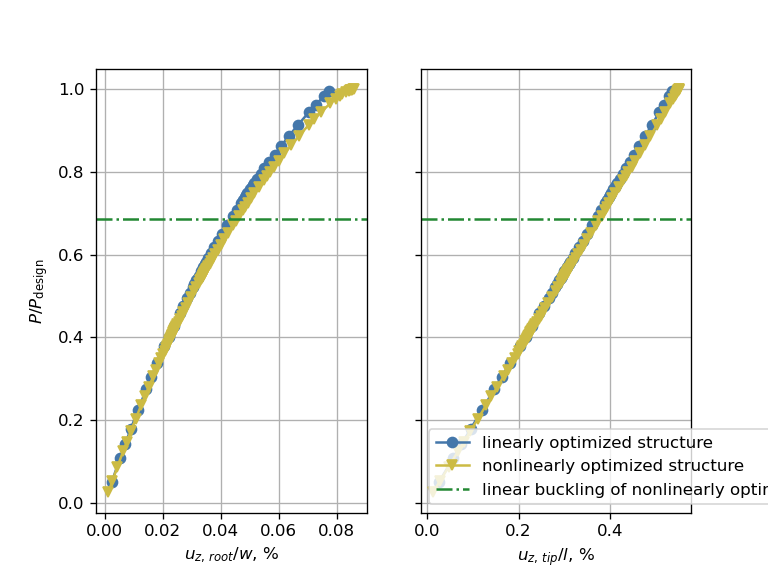

In [54]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[curved_skin_plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[curved_skin_plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["linearly optimized structure", "nonlinearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        last_plot_index = np.argmin(np.abs(nondimensional_loads_dict[design_key] - 1)) + 1  # limit plot to applied loads less than or equal to design load
        plot_utils.plot_2d_load_displacements_stability(
            axes[ax_index],
            nondimensional_displacements_dict[design_key][displacement_key][:last_plot_index]*100,
            nondimensional_loads_dict[design_key][:last_plot_index],
            eigenvalues_dict[design_key][:, :last_plot_index],
            MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=buckling_load_factor, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="linear buckling of nonlinearly optimized structure")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load.

Deformation at design load of linearly optimized structure:


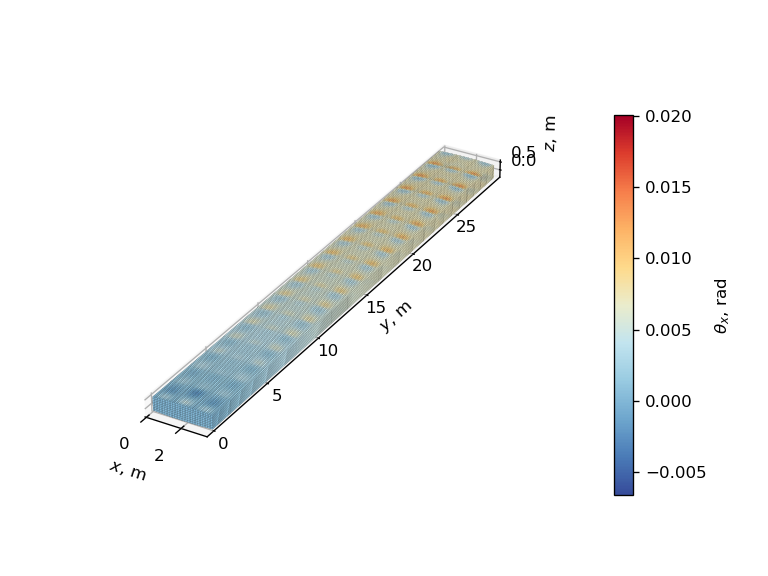

Deformation at design load of nonlinearly optimized structure:


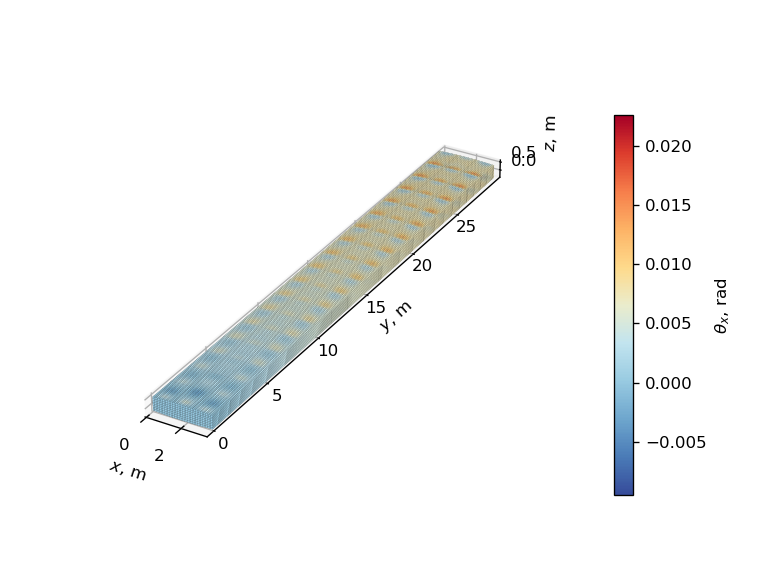

In [55]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = plot_utils.plot_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

### Flat skins <a name="nonlinear-flat"></a>

Record objective and constraint functions of initial design.

In [56]:
# Modify input bdf and run model
flat_skin_bending_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD  # scale load to design load
dmap_stop = flat_skin_bending_bdf.executive_control_lines[1].replace("nobuckle", "stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
flat_skin_bending_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to store eigenvectors
flat_skin_nonlinear_problem.model.nastran_solver.options['input_name'] = "sol_106_flat_nonlinear_opt_start"
flat_skin_nonlinear_problem.run_model()

# Store and print results of initial design
mass_0 = flat_skin_nonlinear_problem['nastran_solver.mass'][0]
ks_stability_0 = flat_skin_nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = flat_skin_nonlinear_problem["nastran_solver.ks_stress"][0]
print(f"""Initial KS value for stability: {ks_stability_0:.3f} N/m
Initial KS value for stress: {ks_stress_0:.0f} MPa
Initial mass: {mass_0*1e3:.0f} kg""")

Nastran job sol_106_flat_nonlinear_opt_start.bdf completed
Wall time: 1456.0 s
Initial KS value for stability: -7.724 N/m
Initial KS value for stress: -391 MPa
Initial mass: 4092 kg


Run optimization and plot optimization history.

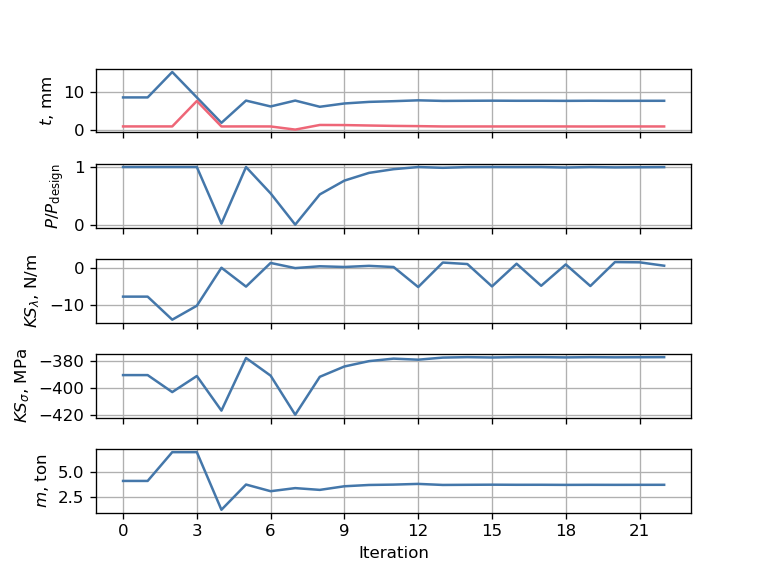

Design variables, constraints and objective at last iteration:
- interp.t_cp: [7.767 1.   ]
- nastran_solver.applied_load: [0.999]
- nastran_solver.ks_stability: [0.649]
- nastran_solver.ks_stress: [-377.304]
- nastran_solver.mass: [3.711]


In [57]:
# Set default input values of sol_106 component
flat_skin_nonlinear_problem.model.set_input_defaults('interp.t_cp', flat_skin_linear_opt_thickness_array)
input_name = "sol_106_flat_nonlinear_opt"
flat_skin_nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
flat_skin_nonlinear_problem.driver = om.ScipyOptimizeDriver()
flat_skin_nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
flat_skin_nonlinear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
flat_skin_nonlinear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
flat_skin_nonlinear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
flat_skin_nonlinear_problem.model.add_constraint('nastran_solver.ks_stability', upper=0., ref=np.abs(ks_stability_0))  # scale KS function for nonlinear structural stability so that the initial value is 1
flat_skin_nonlinear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
flat_skin_nonlinear_problem.model.add_constraint('nastran_solver.load_factor', lower=DESIGN_LOAD*.99, ref=DESIGN_LOAD)  # scale applied load so that design

# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
flat_skin_nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
flat_skin_nonlinear_problem.setup()  # re-setup problem
flat_skin_nonlinear_problem.set_solver_print(0)  # disable solver output
flat_skin_nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    flat_skin_nonlinear_problem.run_driver()  # run optimization
flat_skin_nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history
_, flat_skin_nonlinear_opt_histories = optimization_utils.plot_optimization_history(recorder_filepath)

Find last feasible design and print results.

In [58]:
# Find index of last feasible design
feasible_design_index = np.where(flat_skin_nonlinear_opt_histories['nastran_solver.ks_stability'][:, 0] < OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in flat_skin_nonlinear_opt_histories:
    print(f"- {key}: {flat_skin_nonlinear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (flat_skin_nonlinear_opt_histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
print(f"Mass variation w.r.t. linearly optimized structure: {mass_percentage_variation:.1f} %")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [7.777 0.987]
- nastran_solver.applied_load: [1.]
- nastran_solver.ks_stability: [-4.851]
- nastran_solver.ks_stress: [-377.304]
- nastran_solver.mass: [3.71]
Mass variation w.r.t. linearly optimized structure: -9.3 %


Plot eigenvalues of tangent stiffness matrix.

Nastran job sol_106_flat_nonlinear_opt.bdf completed
Wall time: 3556.0 s


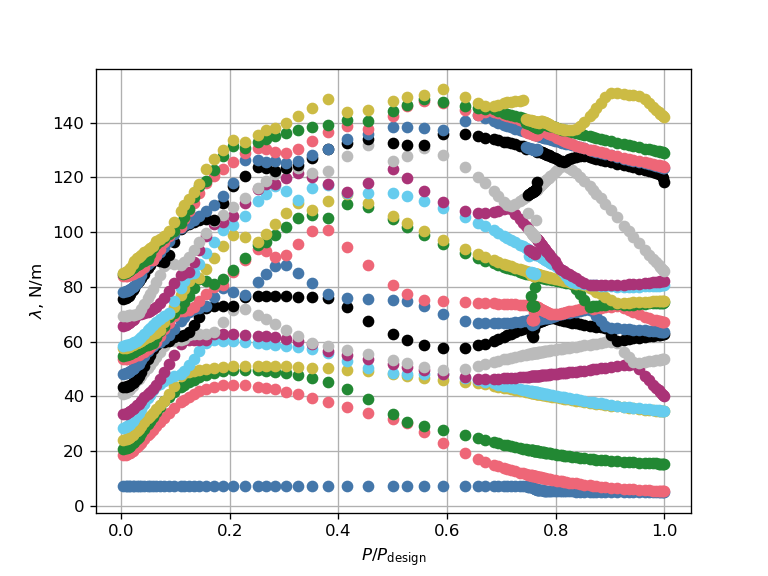

In [59]:
# Run analysis of last feasible design
flat_skin_nonlinear_opt_thickness_array = flat_skin_nonlinear_opt_histories['interp.t_cp'][feasible_design_index]
flat_skin_nonlinear_problem.set_val('interp.t_cp', flat_skin_nonlinear_opt_thickness_array)
flat_skin_nonlinear_problem.run_model()

# Read load and displacement history
key = "flat skins"
sol_106_op2_dict[key] = flat_skin_nonlinear_problem['nastran_solver.op2']
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=flat_skin_plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Run linear buckling analysis of nonlinearly optimized structure.

Nastran job sol_105_flat_nonlinear_opt.bdf completed
Wall time: 47.0 s
P_SOL 105/P_design = 0.73
Critical buckling mode:


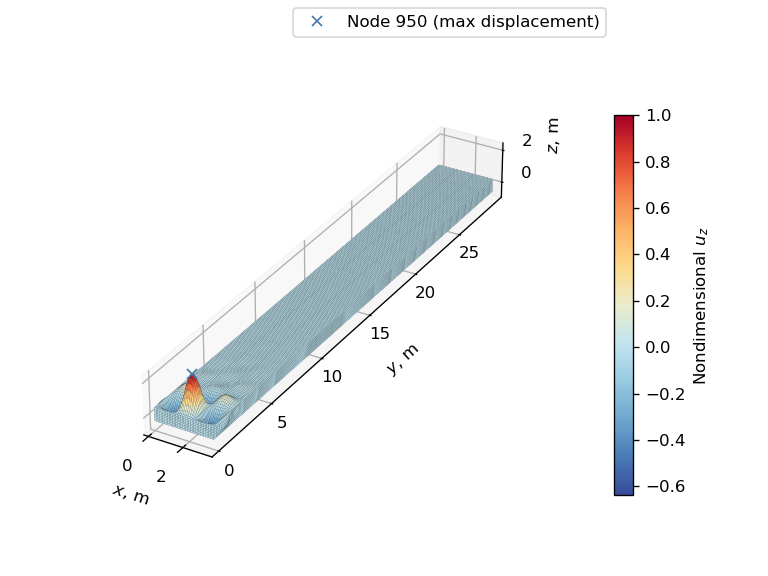

In [60]:
# Modify name of bdf file and input thicknesses and run analysis
flat_skin_linear_problem.model.options['input_name'] = "sol_105_flat_nonlinear_opt"
flat_skin_linear_problem.setup()
flat_skin_linear_problem.set_val('interp.t_cp', flat_skin_nonlinear_opt_thickness_array)
flat_skin_linear_problem.run_model()

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = flat_skin_linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot load-displacement diagrams for linearly and nonlinearly optimized structure.

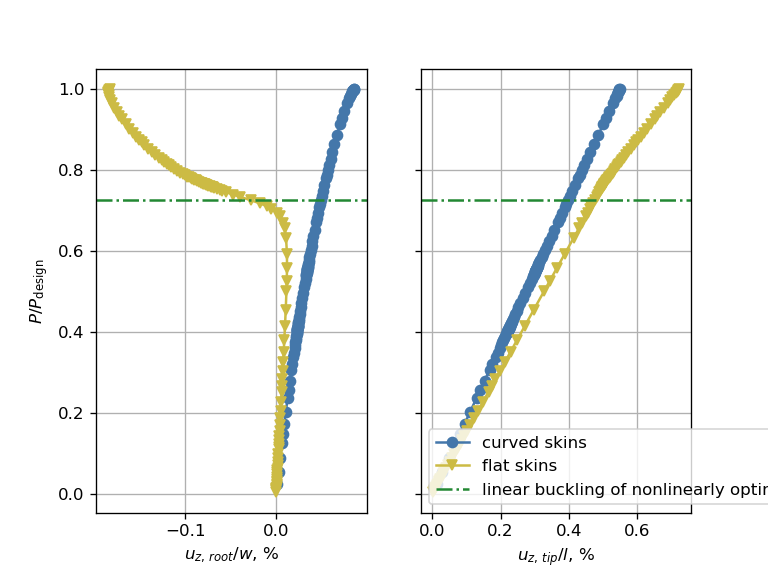

In [61]:
# Nondimensionalize displacements of linearly optimized structure with flat skins
nondimensional_displacements_dict[key] = {"root": displacements[flat_skin_plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
                                          "tip": displacements[flat_skin_plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
mapping_dict = {"curved skins": "nonlinearly optimized structure", "flat skins": "flat skins"}  # dictonaries to map the keys
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, (label, design_key) in enumerate(mapping_dict.items()):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(
            axes[ax_index],
            nondimensional_displacements_dict[design_key][displacement_key]*100,
            nondimensional_loads_dict[design_key],
            eigenvalues_dict[design_key],
            MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=label))  # create proxy artist for the legend
    axes[ax_index].axhline(y=buckling_load_factor, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="linear buckling of nonlinearly optimized structure")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load.

Deformation at design load of curved skins:


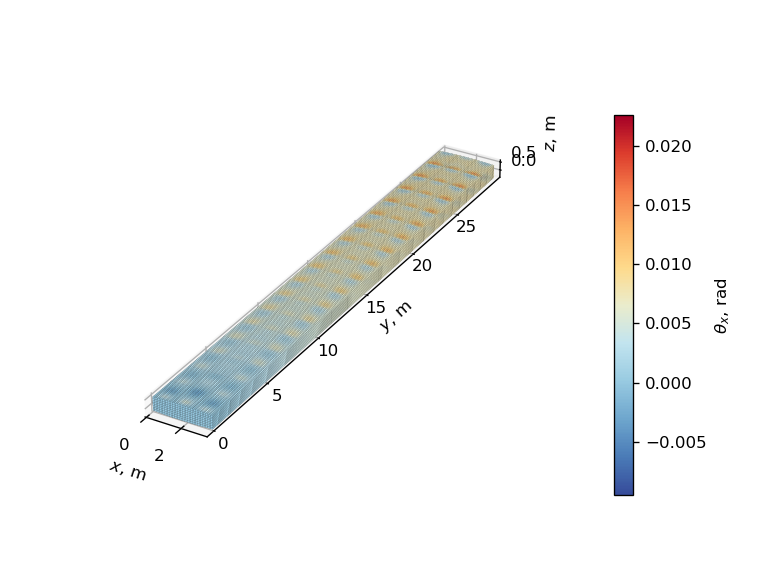

Deformation at design load of flat skins:


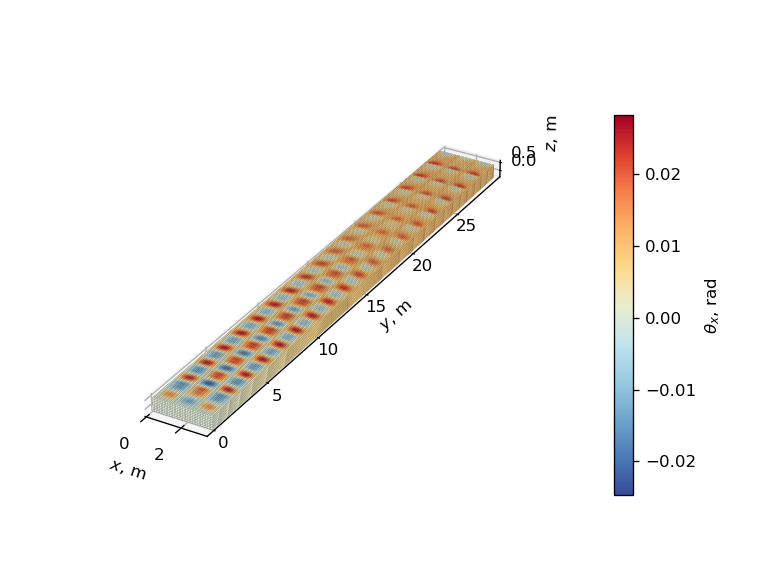

In [62]:
for design_label, design_key in mapping_dict.items():  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {design_label}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[design_key] - 1))  # find index of design load
    _, ax, cbar = plot_utils.plot_deformation(
        op2=sol_106_op2_dict[design_key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m',
        unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()